Here we are going to use traditional time series methods like ARIMA, SARIMA and machine learning approaches like DecisionTreeRegressor  from scikit-learn and Xgboost ensemble methods

In [196]:
#importing modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings(action='ignore') 
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [125]:
#reading the data
data = pd.read_csv("modelling_data.csv")
data.head()

,facility_name,ParkID,zone_id,total_parking_spots,occupancy_total,day_of_week,date,time,parking_availability,time_category,z_score
0,Edmondson Park South Car Park,1,1,1429,28,Friday,2023-12-01,00:09:20,1401,Night,2.535373
1,Edmondson Park South Car Park,1,1,1429,27,Friday,2023-12-01,00:12:57,1402,Night,2.537913
2,Edmondson Park South Car Park,1,1,1429,26,Friday,2023-12-01,00:13:45,1403,Night,2.540453
3,Edmondson Park South Car Park,1,1,1429,25,Friday,2023-12-01,00:17:43,1404,Night,2.542992
4,Edmondson Park South Car Park,1,1,1429,25,Friday,2023-12-01,00:27:43,1404,Night,2.542992


In [126]:
dddata= data.copy()

Joining date and time together to create a timestamp

In [127]:
def g(df):
    df["time"] = df["time"].astype("str")
    df["timestamp"] = pd.to_datetime(df['date'] + ' ' + df['time'], format='%Y-%m-%d %H:%M:%S')
    return df

modelling_data = g(data)
#setting timestamp as the index
modelling_data.set_index("timestamp",  inplace=True)

In [128]:
#dropping columns we dont need
modelling_data.drop(["ParkID", "zone_id", "date", "time"], axis= 1,inplace= True)
modelling_data

,facility_name,total_parking_spots,occupancy_total,day_of_week,parking_availability,time_category,z_score
timestamp,,,,,,,
2023-12-01 00:09:20,Edmondson Park South Car Park,1429,28,Friday,1401,Night,2.535373
2023-12-01 00:12:57,Edmondson Park South Car Park,1429,27,Friday,1402,Night,2.537913
2023-12-01 00:13:45,Edmondson Park South Car Park,1429,26,Friday,1403,Night,2.540453
2023-12-01 00:17:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992
2023-12-01 00:27:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992
...,...,...,...,...,...,...,...
2023-12-31 23:21:38,Campbelltown Hurley Street South Car Park,118,62,Sunday,56,Night,-0.880331
2023-12-31 23:31:38,Campbelltown Hurley Street South Car Park,118,62,Sunday,56,Night,-0.880331
2023-12-31 23:39:15,Campbelltown Hurley Street South Car Park,118,61,Sunday,57,Night,-0.877792


In [129]:
modelling_data.columns

Index(['facility_name', 'total_parking_spots', 'occupancy_total',
       'day_of_week', 'parking_availability', 'time_category', 'z_score'],
      dtype='object')

1. ARIMA model analysis
#
Doing analysis of trends using rolling means of different sizes

In [130]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose  import ColumnTransformer
from sklearn.model_selection import train_test_split

# Define the columns to be one-hot encoded
categorical_columns = ['facility_name', 'day_of_week', 'time_category']

# Define the remaining columns
remaining_columns = modelling_data.columns.difference(categorical_columns)

# Create a ColumnTransformer
ohe_pipeline = Pipeline(steps=[
    ('enc', OneHotEncoder(drop="first", sparse=False))
])

transformer = ColumnTransformer(transformers=[
        ("ohe", ohe_pipeline, categorical_columns)], remainder="passthrough")

# Fitting and transforming the data
transformed_data = transformer.fit_transform(modelling_data)

# Get the column names after transformation
feature_names = (
    transformer.named_transformers_["ohe"]
    .named_steps["enc"]
    .get_feature_names_out(input_features=categorical_columns)
)

# Combine column names for the transformed data
column_names = list(feature_names) + list(remaining_columns)

# Create a DataFrame with appropriate column names
preprocessed_data = pd.DataFrame(data=transformed_data, columns=column_names, index=modelling_data.index)


In [131]:
preprocessed_data.head()



,facility_name_Campbelltown Farrow Rd North Car Park,facility_name_Campbelltown Hurley Street South Car Park,facility_name_Cherrybrook Car Park,facility_name_Dee Why Car Park,facility_name_Edmondson Park South Car Park,facility_name_Gordon Henry St North Car Park,facility_name_Gosford Car Park,facility_name_Hills Showground Car Park,facility_name_Hornsby Jersey St Car Park,facility_name_Kellyville North Car Park,...,day_of_week_Wednesday,time_category_Early Morning,time_category_Evening,time_category_Late Afternoon,time_category_Morning,time_category_Night,occupancy_total,parking_availability,total_parking_spots,z_score
timestamp,,,,,,,,,,,,,,,,,,,,,
2023-12-01 00:09:20,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1429.0,28.0,1401.0,2.535373
2023-12-01 00:12:57,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1429.0,27.0,1402.0,2.537913
2023-12-01 00:13:45,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1429.0,26.0,1403.0,2.540453
2023-12-01 00:17:43,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1429.0,25.0,1404.0,2.542992
2023-12-01 00:27:43,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1429.0,25.0,1404.0,2.542992


In [132]:
plotting_data = modelling_data.copy()
plotting_data.drop(columns=['facility_name', 'total_parking_spots', 'occupancy_total',
    'day_of_week', 'time_category', 'z_score'], inplace=True, axis=1)


In [133]:
plotting_data

,parking_availability
timestamp,
2023-12-01 00:09:20,1401
2023-12-01 00:12:57,1402
2023-12-01 00:13:45,1403
2023-12-01 00:17:43,1404
2023-12-01 00:27:43,1404
...,...
2023-12-31 23:21:38,56
2023-12-31 23:31:38,56
2023-12-31 23:39:15,57


Plotting the total parking availability for time and day of the week

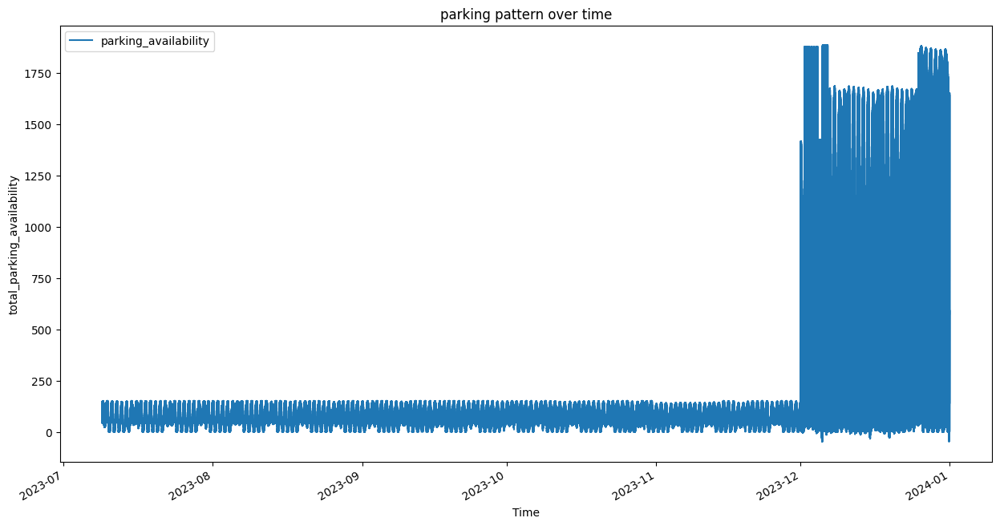

In [134]:
#plotting the parking availability trend
plotting_data.plot(figsize = (15, 8))
plt.title("parking pattern over time")
plt.xlabel('Time')
plt.ylabel("total_parking_availability")
plt.show()

Our time series data has high frequency or irregular time intervals, we considered resampling to a lower frequency to obtain a more meaningful plot. Resampling allows you to aggregate data over specified time intervals, in our case we shall resample the data down to day, week and month
#
We wrote a function to help us plot the patterns

In [135]:
#helper function for plotting patterns
def parking_pattern(data, size):
    data.plot(figsize = (15, 8))
    plt.title(f"parking pattern on a {size} basis")
    plt.xlabel('Time')
    plt.ylabel("total_parking_availability")
    plt.show()

1. Daily pattern of parking availability

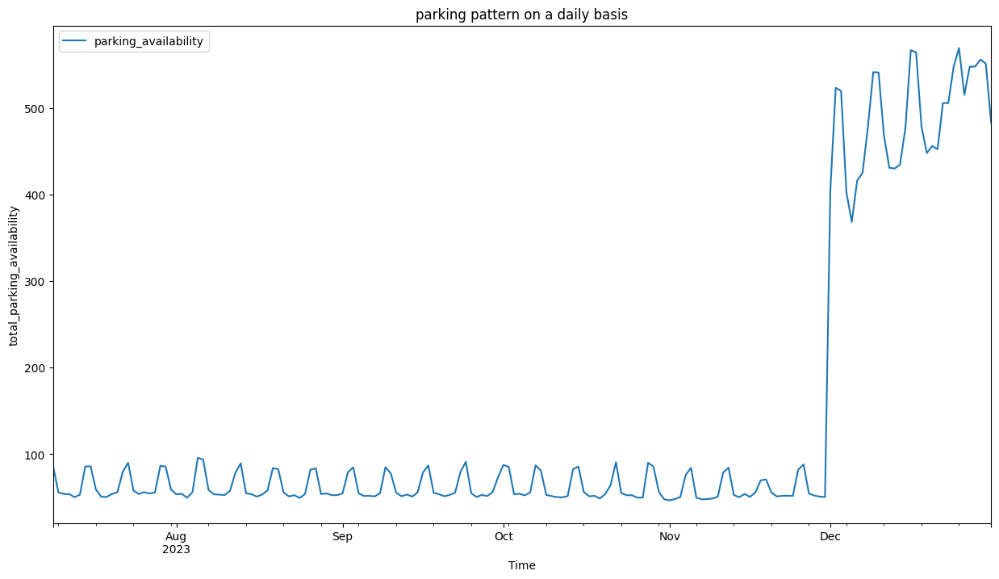

In [136]:
daily_pattern = plotting_data.resample("D").mean()
parking_pattern(daily_pattern, "daily")

2. Weekly pattern

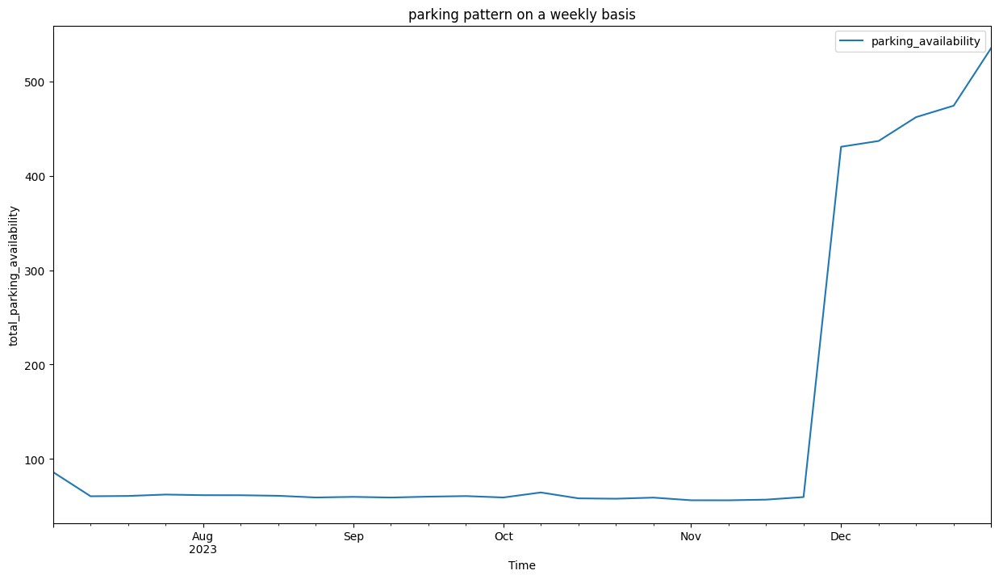

In [137]:
weekly_pattern = plotting_data.resample("W").mean()
parking_pattern(weekly_pattern, "weekly")

Monthly parking pattern

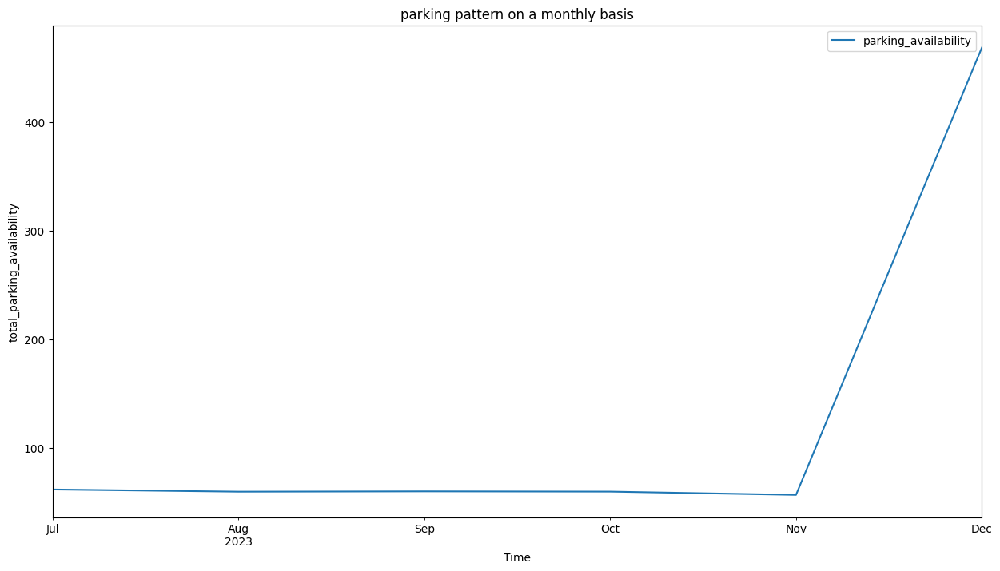

In [138]:
monthly_pattern = plotting_data.resample("M").mean()
parking_pattern(monthly_pattern, "monthly")

Checking for stationarity. A time series is considered stationary if its statistical properties, such as mean, variance, and autocorrelation, do not change over time. In simple words, the time series data shows consistent behavior and does not exhibit trends or seasonality.

In [139]:
#importing adfuller test from statsmodels
from statsmodels.tsa.stattools import adfuller
def stationarity_test(dataset):
    ad_test = adfuller(dataset, autolag = "AIC")
    print("1. ADF: ",ad_test[0])
    print("2. p-value: ",ad_test[1])
    print("3. Number of lags: ", ad_test[2])
    print("4. Number of obeservations used for ADF regression and critical values calculation: ", ad_test[3])
    print("5. Critical values: ")
    

In [140]:
# stationarity_test(plotting_data["total_parking_spots"])

instantiating the `autoarima model` for our time series problem

In [141]:
# from pmdarima import auto_arima
# from sklearn.metrics import mean_squared_error, mean_absolute_error
# #fitting the model
# auto_arima_model = auto_arima(plotting_data["parking_availability"], trace= True, suppress_warnings= True)

In [142]:
daily_pattern

,parking_availability
timestamp,
2023-07-09,86.091106
2023-07-10,55.566964
2023-07-11,53.878049
2023-07-12,53.682893
2023-07-13,50.186798
...,...
2023-12-27,547.711993
2023-12-28,547.839515
2023-12-29,555.895052


Now that we already know the behavior of our data, the model to use and and the order to specify we will go ahead and train a model and make some few predictions. We are also going to split our data into train, test and validation

In [143]:
#importing arima model
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt
#splitting data
train_data, test_data = train_test_split(daily_pattern, test_size= 0.3, random_state= 42)

In [144]:
#instantiating ARIMA model
arima_model = ARIMA(train_data, order = (2, 1, 2))
arima_model = arima_model.fit()
arima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                SARIMAX Results                                 
================================================================================
Dep. Variable:     parking_availability   No. Observations:                  123
Model:                   ARIMA(2, 1, 2)   Log Likelihood                -799.475
Date:                  Sun, 11 Feb 2024   AIC                           1608.950
Time:                          07:18:29   BIC                           1622.970
Sample:                               0   HQIC                          1614.644
                                  - 123                                         
Covariance Type:                    opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5834      0.808     -0.722      0.470      -2.167       1.001
ar.L2         -0.1243      0.109     -1.145      0.252      -0.337       0.089
ma.L1         -0.4754      2.494     -0.191      0.849      -5.364       4.413
ma.L2         -0.5243      1.734     -0.302      0.762      -3.922       2.874
sigma2      2.769e+04   6.96e+04      0.398      0.691   -1.09e+05    1.64e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):                56.43
Prob(Q):                              0.81   Prob(JB):                         0.00
Heteroskedasticity (H):               1.99   Skew:                             1.59
Prob(H) (two-sided):                  0.03   Kurtosis:                         3.99
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

We will also do a prediction to see how well our model has learnt. For the predict method, you need to pass in the start and end parameters for the period you want to predict

In [145]:
#specifying start and end
start = len(train_data)
end = len(train_data) + len(test_data)-1
predictions = arima_model.predict(start = start, end= end, type = "level")
predictions.index = plotting_data.index[start:end+1]
print(round(predictions, 2))


timestamp
2023-12-01 06:20:02    154.40
2023-12-01 06:21:02    143.76
2023-12-01 06:21:42    136.82
2023-12-01 06:24:01    142.19
2023-12-01 06:24:06    139.92
2023-12-01 06:24:13    140.58
2023-12-01 06:24:19    140.48
2023-12-01 06:25:38    140.45
2023-12-01 06:25:43    140.48
2023-12-01 06:28:24    140.47
2023-12-01 06:28:30    140.47
2023-12-01 06:29:01    140.47
2023-12-01 06:29:20    140.47
2023-12-01 06:31:51    140.47
2023-12-01 06:33:01    140.47
2023-12-01 06:33:46    140.47
2023-12-01 06:33:55    140.47
2023-12-01 06:34:03    140.47
2023-12-01 06:34:27    140.47
2023-12-01 06:34:55    140.47
2023-12-01 06:35:13    140.47
2023-12-01 06:35:56    140.47
2023-12-01 06:36:12    140.47
2023-12-01 06:37:26    140.47
2023-12-01 06:37:47    140.47
2023-12-01 06:38:00    140.47
2023-12-01 06:38:06    140.47
2023-12-01 06:38:12    140.47
2023-12-01 06:38:56    140.47
2023-12-01 06:39:04    140.47
2023-12-01 06:39:21    140.47
2023-12-01 06:39:27    140.47
2023-12-01 06:39:59    140.47


Plotting prediction against  actual for a given time series to see how the model behaves visually

<Axes: xlabel='timestamp'>

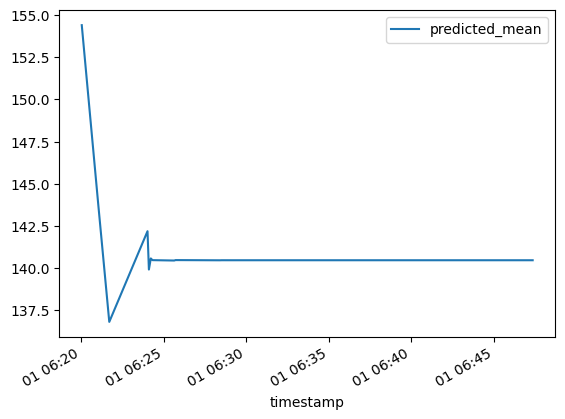

In [146]:
predictions.plot(legend =True)
# daily_pattern["parking_availability"].plot(legend= True)


If you want to see exactly how good or bad it is we can check the `mae` and the `rmse` of our train and test data then compare it to the mean of our dataset

In [147]:
print(daily_pattern.mean())

parking_availability    136.861683
dtype: float64


In [148]:
#getting the mse and rmse
pred_rmse = sqrt(mean_squared_error(predictions, test_data))
print(pred_rmse)

160.19892446636382


The rmse range is greater than the mean of the data, meaning that for every prediction we make we are  getting a value 160.2 further away from the actual result. This means that our model is not performing well and needs improvement
#
#### Making future predictions
For this to take place effectively we will train the model on the whole dataset

In [149]:
# arima_model2 = ARIMA(plotting_data, order= (2,1,2))
# arima_model2 = arima_model2.fit()

In [150]:
# #setting up future dates 
# future_dates = pd.date_range(start= "2024-01-01", end = "2024-01-31")
# #making prediction
# future_preds = arima_model2.predict(start = len(plotting_data), end = len(plotting_data)+ 30, type = "levels")
# future_preds.index = future_dates
# print(future_preds)

Viewing the predictions from the `ARIMA` model, we can see there is similarity in the values except for the decimal values. This indicates our model  has not captured most of the seasonality and trend component.Our model maybe also overfitting  to the training data or it may be that the series does not have a strong enough seasonal component.

Having also many facilities makes it hard to interpret the prediction for each facility. To overcome this problem, we are going to group our data using facility name and then model time series for each facility in our dataset. This will ease prediction of a parking availability for a given facility, date and time

In [151]:
grouped_data = dddata.copy()
grouped_data.drop(columns=["ParkID", "zone_id"], axis= 1,inplace= True)

In [152]:
grouped_data

,facility_name,total_parking_spots,occupancy_total,day_of_week,date,time,parking_availability,time_category,z_score
0,Edmondson Park South Car Park,1429,28,Friday,2023-12-01,00:09:20,1401,Night,2.535373
1,Edmondson Park South Car Park,1429,27,Friday,2023-12-01,00:12:57,1402,Night,2.537913
2,Edmondson Park South Car Park,1429,26,Friday,2023-12-01,00:13:45,1403,Night,2.540453
3,Edmondson Park South Car Park,1429,25,Friday,2023-12-01,00:17:43,1404,Night,2.542992
4,Edmondson Park South Car Park,1429,25,Friday,2023-12-01,00:27:43,1404,Night,2.542992
...,...,...,...,...,...,...,...,...,...
599280,Campbelltown Hurley Street South Car Park,118,62,Sunday,2023-12-31,23:21:38,56,Night,-0.880331
599281,Campbelltown Hurley Street South Car Park,118,62,Sunday,2023-12-31,23:31:38,56,Night,-0.880331
599282,Campbelltown Hurley Street South Car Park,118,61,Sunday,2023-12-31,23:39:15,57,Night,-0.877792
599283,Campbelltown Hurley Street South Car Park,118,61,Sunday,2023-12-31,23:49:15,57,Night,-0.877792


In [153]:
# import prophet
# # Create the ColumnTransformer
# ohe_pipeline = Pipeline(steps=[('enc', OneHotEncoder(drop="first", sparse=False))])
# transformer = ColumnTransformer(transformers=[("ohe", ohe_pipeline, categorical_columns)], remainder="passthrough")

# # Group data by facility_name
# grouped_data = modelling_data.groupby("facility_name")

# # Loop through each facility until the last one
# for facility, facility_data in grouped_data:
#     # Apply OHE within this facility's data
#     transformed_data = transformer.fit_transform(facility_data)

#     # Reconstruct DataFrame with encoded columns
#     transformed_df = pd.DataFrame(transformed_data, columns=transformer.get_feature_names_out())

#     # Select columns for Prophet (assuming 'ds' for datetime, 'occupancy_total' for target)
#     model_data = transformed_df[['ohe__day_of_week_Monday', 'ohe__day_of_week_Saturday',
#     'ohe__day_of_week_Sunday', 'ohe__day_of_week_Thursday',
#     'ohe__day_of_week_Tuesday', 'ohe__day_of_week_Wednesday',
#     'ohe__time_category_Early Morning', 'ohe__time_category_Evening',
#     'ohe__time_category_Late Afternoon', 'ohe__time_category_Morning',
#     'ohe__time_category_Night', 'remainder__total_parking_spots',
#     'remainder__occupancy_total', 'remainder__parking_availability',
#     'remainder__z_score', 'date', 'time']] 

#     # Create and fit Prophet model
#     model = prophet.Prophet()
#     model.fit(model_data)

#     # Make predictions for a specified future period (e.g., next week)
#     future = model.make_future_dataframe(periods=prediction_period)
#     forecast = model.predict(future)

#     # Analyze and store results for this facility (optional)
#     # ...

#     # Check if this is the last facility
#     if next(iter(grouped_data), None) is None:  # Check if there are no more facilities
#         print("Processed predictions for all facilities")
#         break

# # Further analysis or visualization using predictions/models for each facility (optional)
# # ...



We will create a class for the `Prophet` that iterates over grouped data does time series using given columns and allows us to make predictions  on future data. 

First lets preprocess our categorical/string dtype columns

In [154]:
from datetime import datetime
#function to conver to datetime
def to_datetime(x):
    return datetime.strptime(x,  "%Y-%m-%d %H:%M:%S")

pprophet_data = pd.read_csv("modelling_data.csv", parse_dates= [["date", "time"]], date_parser= to_datetime)

In [155]:
#setting datetime as index
prophet_data = pprophet_data.drop(["day_of_week", "time_category", "ParkID", "zone_id"], axis= 1)
prophet_data = prophet_data.set_index("date_time").groupby("facility_name").resample("D").mean()
#inspecting our data
prophet_data.head()

total_parking_spots  occupancy_total  \
facility_name        date_time                                          
Bella Vista Car Park 2023-12-01                777.0       332.854559   
                     2023-12-02                777.0       197.873521   
                     2023-12-03                777.0       137.133550   
                     2023-12-04                777.0       346.532401   
                     2023-12-05                777.0       409.501304   

                                 parking_availability   z_score  
facility_name        date_time                                   
Bella Vista Car Park 2023-12-01            444.145441  0.105387  
                     2023-12-02            579.126479  0.448179  
                     2023-12-03            639.866450  0.602431  
                     2023-12-04            430.467599  0.070651  
                     2023-12-05            367.498696 -0.089262

We have two index columns in our grouped dataframe, we will reset the index, return `date_time` as the index and plot  and do some visualizations on our facilities

In [156]:
#resetting index
prophet_data = prophet_data.reset_index()


Plotting all trends in one plot

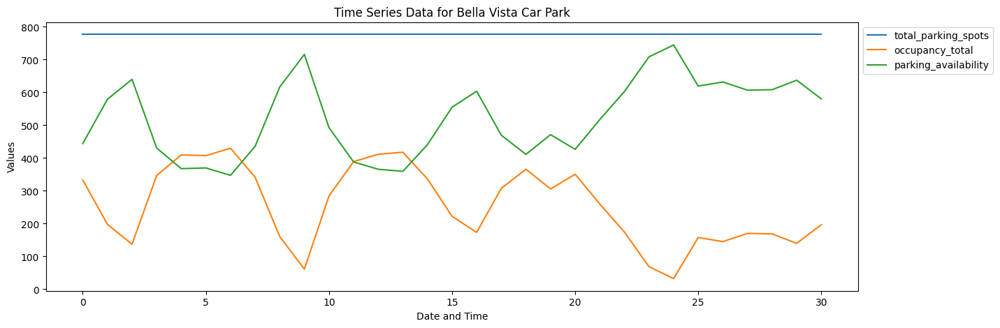

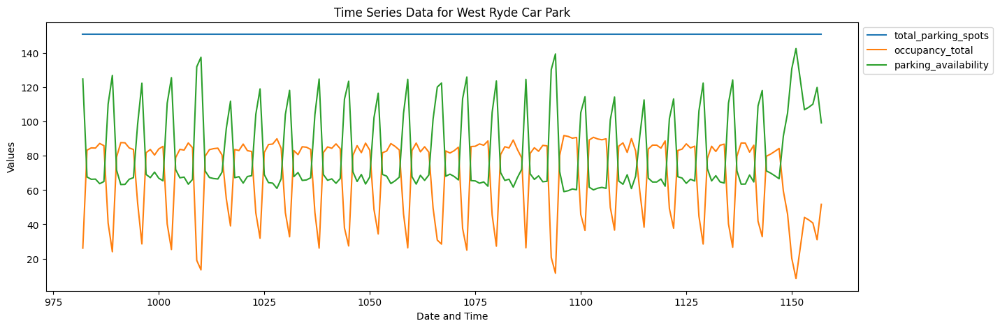

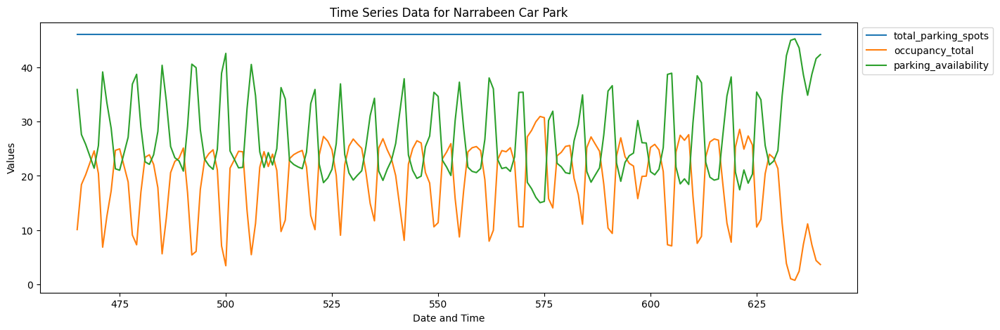

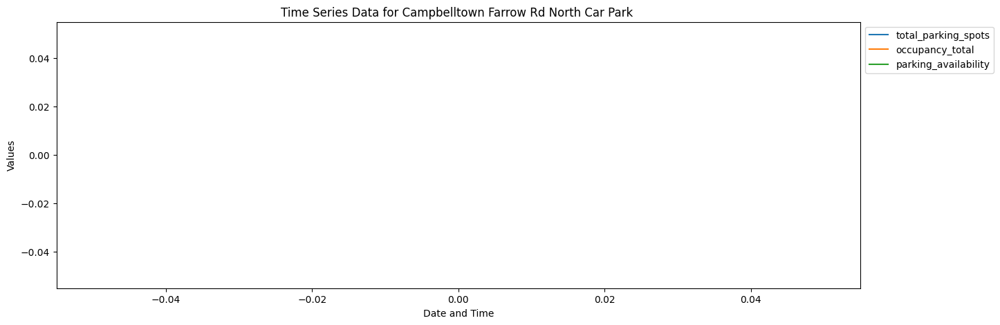

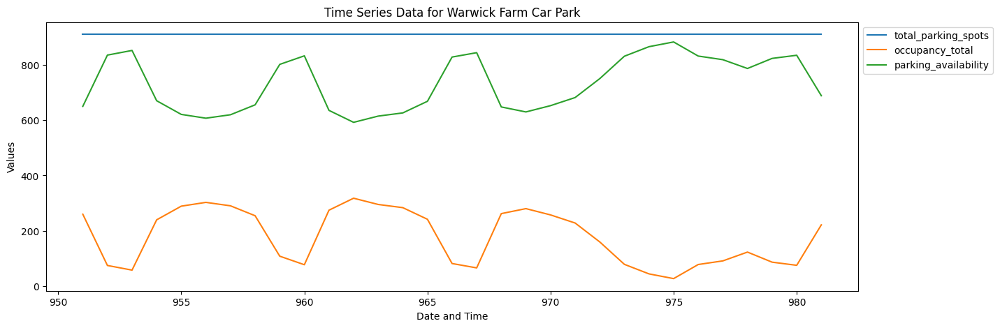

...

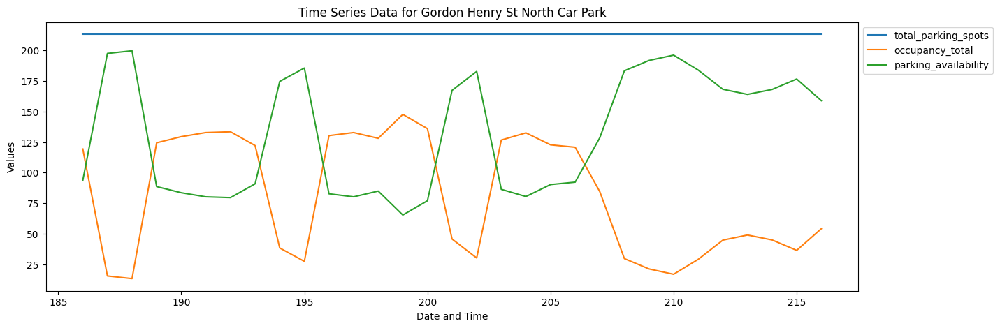

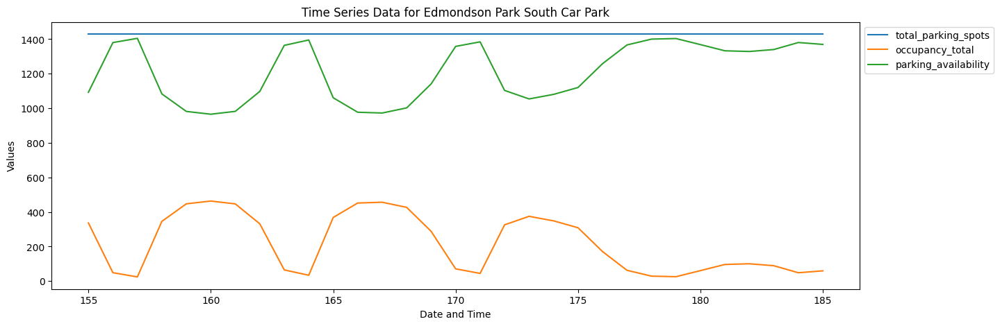

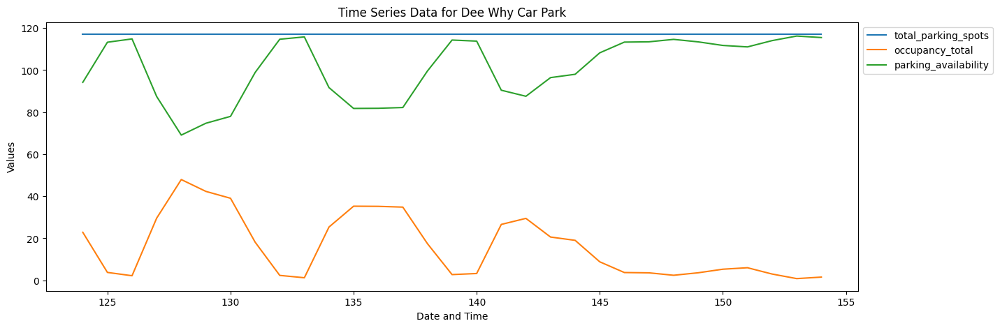

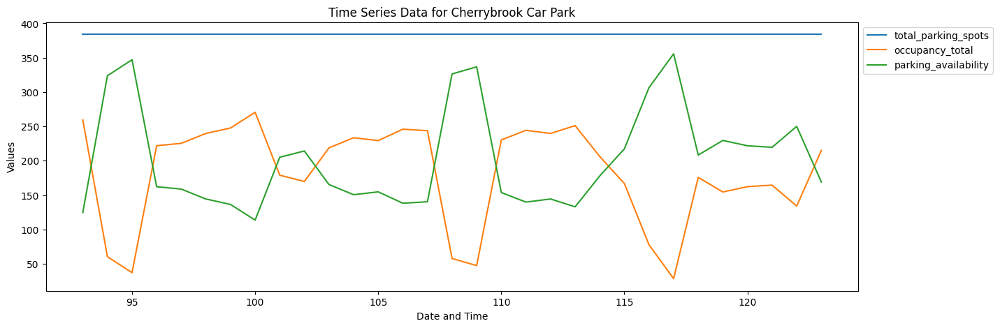

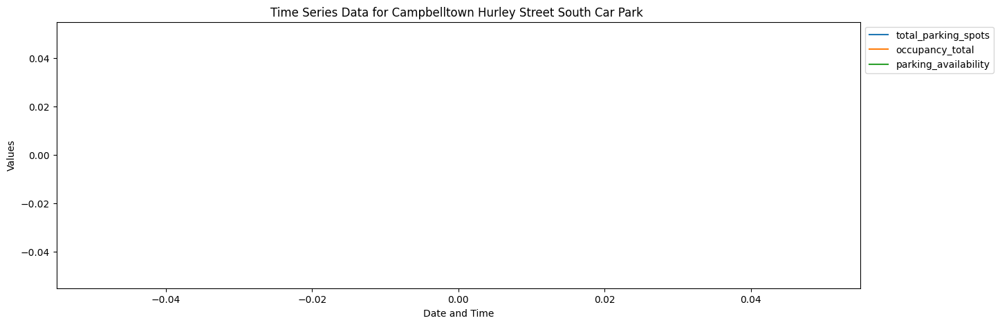

In [157]:
import matplotlib.pyplot as plt

def plot_facilities(data, facilities, columns=["total_parking_spots", "occupancy_total", "parking_availability"], figsize=(15, 5)):
    # Set the 'date_time' column as the index
    data.set_index("date_time")

    # Filter data for the specified facilities
    filtered_data = data[data['facility_name'].isin(facilities)]

    for facility in facilities:
        facility_data = filtered_data.query(f"facility_name == '{facility}'")

        # Create a new figure for each facility
        fig, ax = plt.subplots(figsize=figsize)
        
        # Plot the data for the current facility
        facility_data[columns].plot(ax=ax, label=facility)

        # Set title, labels, and legend
        ax.set_title(f"Time Series Data for {facility}")
        ax.set_xlabel("Date and Time")
        ax.set_ylabel("Values")
        ax.legend(loc="upper left", bbox_to_anchor=(1, 1))

        plt.show()

# Example usage
facilities_to_plot = ["Bella Vista Car Park", "West Ryde Car Park", "Narrabeen Car Park", "Campbelltown Farrow Rd North Car Park " ,
                    "Warwick Farm Car Park", "Warriewood Car Park", "Tallawong P3 Car Park ", "Tallawong P3 Car Park", "Tallawong P2 Car Park",
                    "Tallawong P1 Car Park", "Sutherland East Parade Car Park", "St Marys Car Park", "Schofields Car Park ", "Revesby Car Park",
                    "Penrith Combewood Multi-Level Car Park", "Penrith Combewood At-Grade Car Park", "Leppington Car Park", "Kiama Car Park ",
                    "Kellyville South Car Park", "Kellyville North Car Park", "Hornsby Jersey St Car Park", "Hills Showground Car Park", "Gosford Car Park ",
                    "Gordon Henry St North Car Park", "Edmondson Park South Car Park", "Dee Why Car Park", "Cherrybrook Car Park", "Campbelltown Hurley Street South Car Park "]
plot_facilities(prophet_data, facilities_to_plot, figsize=(15, 5))




Voila! We can see our parking facilities have different seasonalities and trends. We can not generalize this and build one time series model. What we will do is to create separate models for each of the facility, which will allow us to make accurate predictions and forecasting.

In [158]:
prophet_data

,facility_name,date_time,total_parking_spots,occupancy_total,parking_availability,z_score
0,Bella Vista Car Park,2023-12-01,777.0,332.854559,444.145441,0.105387
1,Bella Vista Car Park,2023-12-02,777.0,197.873521,579.126479,0.448179
2,Bella Vista Car Park,2023-12-03,777.0,137.133550,639.866450,0.602431
3,Bella Vista Car Park,2023-12-04,777.0,346.532401,430.467599,0.070651
4,Bella Vista Car Park,2023-12-05,777.0,409.501304,367.498696,-0.089262
...,...,...,...,...,...,...
1153,West Ryde Car Park,2023-12-27,151.0,44.062500,106.937500,-0.750972
1154,West Ryde Car Park,2023-12-28,151.0,42.627692,108.372308,-0.747329
1155,West Ryde Car Park,2023-12-29,151.0,40.794304,110.205696,-0.742673
1156,West Ryde Car Park,2023-12-30,151.0,31.003378,119.996622,-0.717808


#### 1. Prophet model
Prophet is a time series forecasting tool developed by Facebook that utilizes an additive model to capture seasonality, trends, and holidays, providing a user-friendly approach for accurate and efficient predictions.
#
We will create a final dataframe that has the date_time column and the columns we will need for our analysis. Prophet model expects data in a particular format; it expects the name of date column to be "ds" and the target variable as y
#
Before everything we will create a prophet pipeline

In [159]:
#importin
import prophet
#creating a pipeline
prophet_pipeline = Pipeline(steps=[
    ("prophet", prophet.Prophet(interval_width = 0.95))
])

In [160]:
final_prophet_data = prophet_data[["facility_name", "date_time", "total_parking_spots",
                    "occupancy_total", "parking_availability"]].rename({"date_time": "ds", "parking_availability": "y"}, axis = "columns")
final_prophet_data

,facility_name,ds,total_parking_spots,occupancy_total,y
0,Bella Vista Car Park,2023-12-01,777.0,332.854559,444.145441
1,Bella Vista Car Park,2023-12-02,777.0,197.873521,579.126479
2,Bella Vista Car Park,2023-12-03,777.0,137.133550,639.866450
3,Bella Vista Car Park,2023-12-04,777.0,346.532401,430.467599
4,Bella Vista Car Park,2023-12-05,777.0,409.501304,367.498696
...,...,...,...,...,...
1153,West Ryde Car Park,2023-12-27,151.0,44.062500,106.937500
1154,West Ryde Car Park,2023-12-28,151.0,42.627692,108.372308
1155,West Ryde Car Park,2023-12-29,151.0,40.794304,110.205696
1156,West Ryde Car Park,2023-12-30,151.0,31.003378,119.996622


Grouping by facility names to allow us to know all the stations and model different time series

In [161]:
facility_names = final_prophet_data.groupby("facility_name")
facility_names.head()

,facility_name,ds,total_parking_spots,occupancy_total,y
0,Bella Vista Car Park,2023-12-01,777.0,332.854559,444.145441
1,Bella Vista Car Park,2023-12-02,777.0,197.873521,579.126479
2,Bella Vista Car Park,2023-12-03,777.0,137.133550,639.866450
3,Bella Vista Car Park,2023-12-04,777.0,346.532401,430.467599
4,Bella Vista Car Park,2023-12-05,777.0,409.501304,367.498696
...,...,...,...,...,...
982,West Ryde Car Park,2023-07-09,151.0,26.096154,124.903846
983,West Ryde Car Park,2023-07-10,151.0,83.332623,67.667377
984,West Ryde Car Park,2023-07-11,151.0,84.679089,66.320911
985,West Ryde Car Park,2023-07-12,151.0,84.564356,66.435644


Splitting our data into train, test and  validation sets

In [162]:
# for facility in facility_names.groups:
#     group = facility_names.get_group(facility)
#     #train data
#     train = group[(group["ds"]>= "2023-12-01") & (group["ds"]<= "2023-12-16")]
#     #test_data
#     test = group[(group["ds"]>= "2023-12-17") & (group["ds"]<= "2023-12-31")]
    
# print(train.shape)
# print(test.shape)

Creating an empty dataframe so we can build a forecast for the whole 28 facilities

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish 

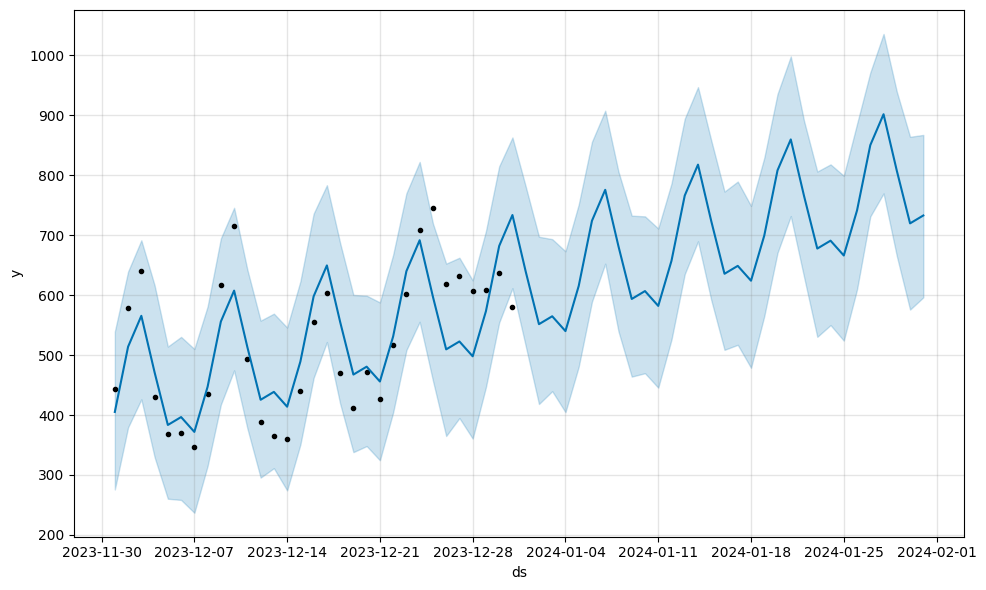

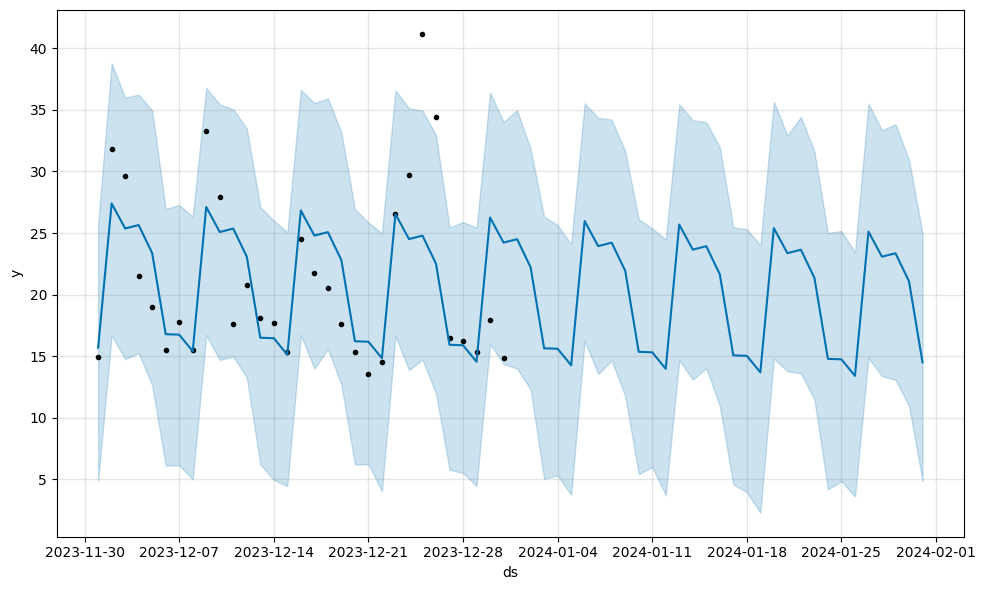

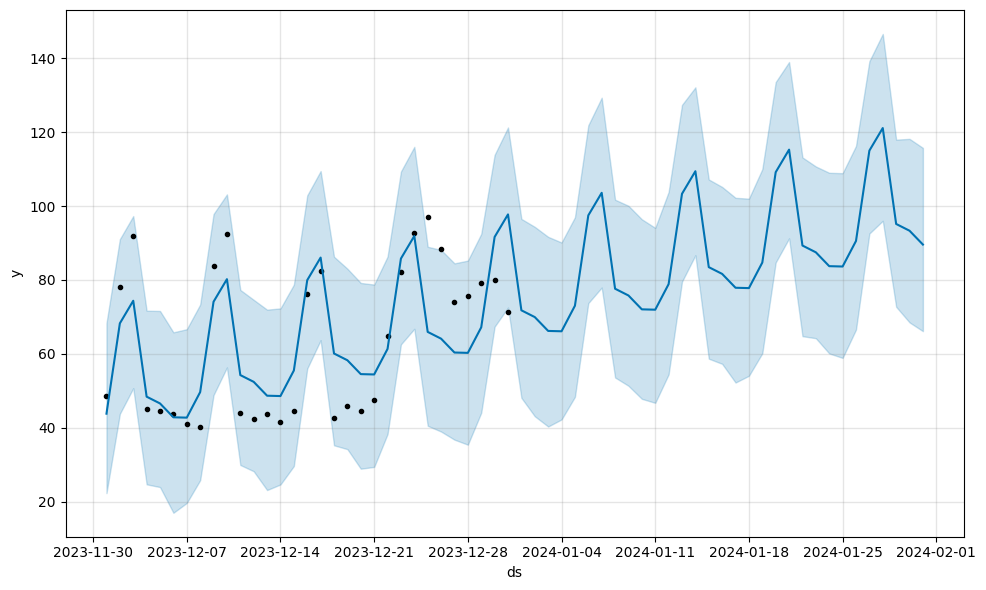

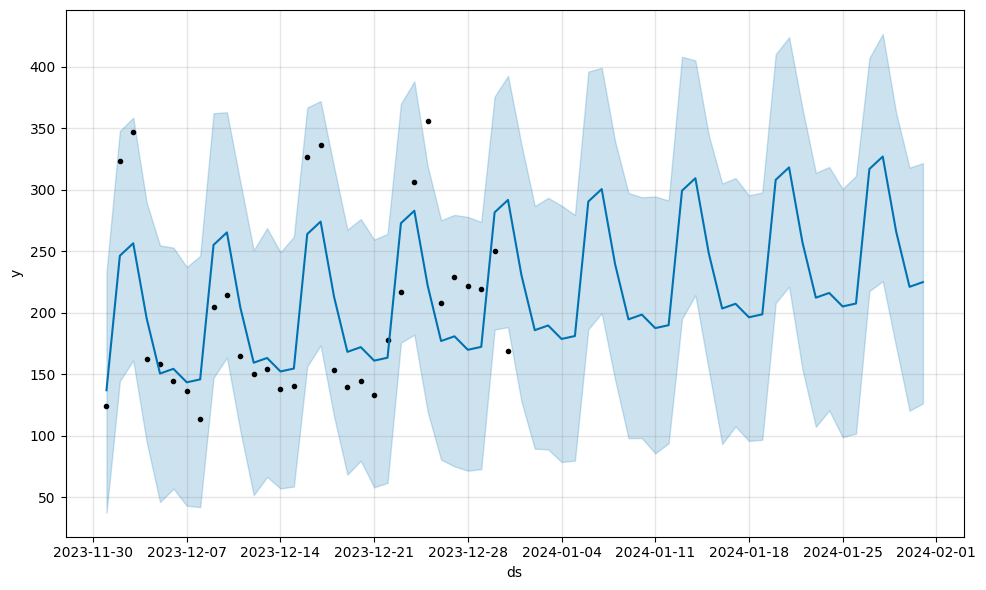

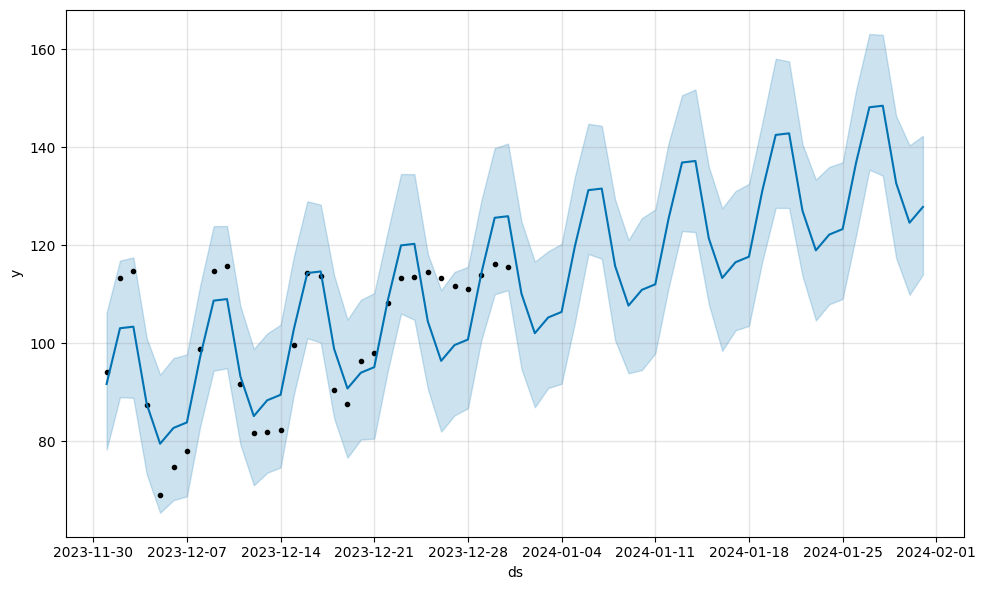

...

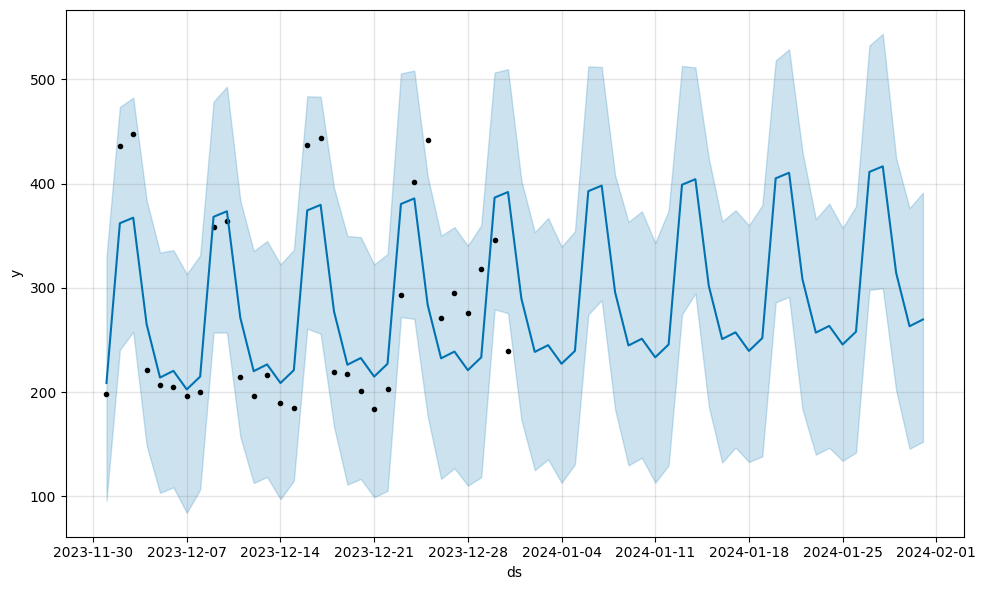

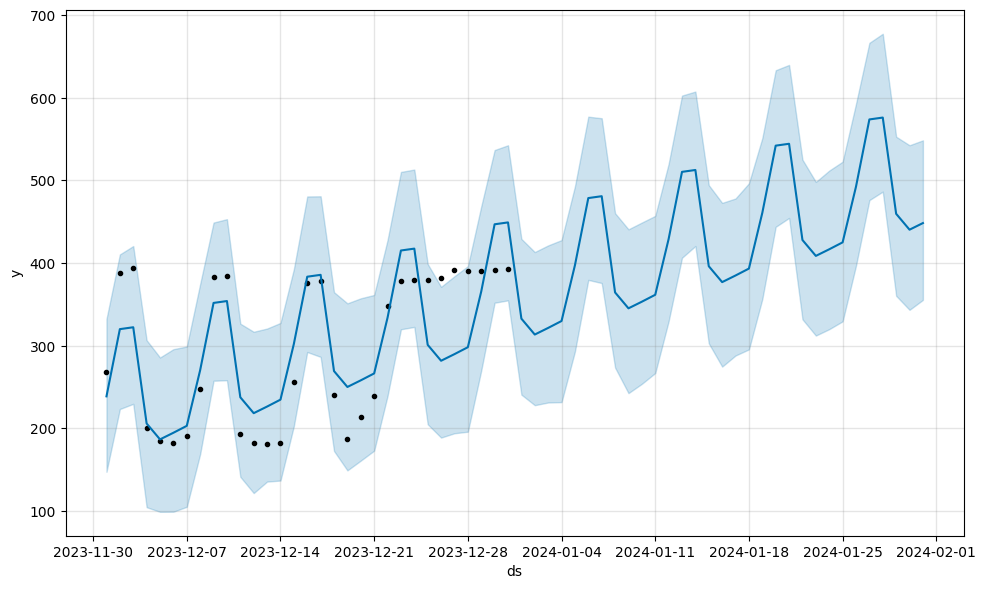

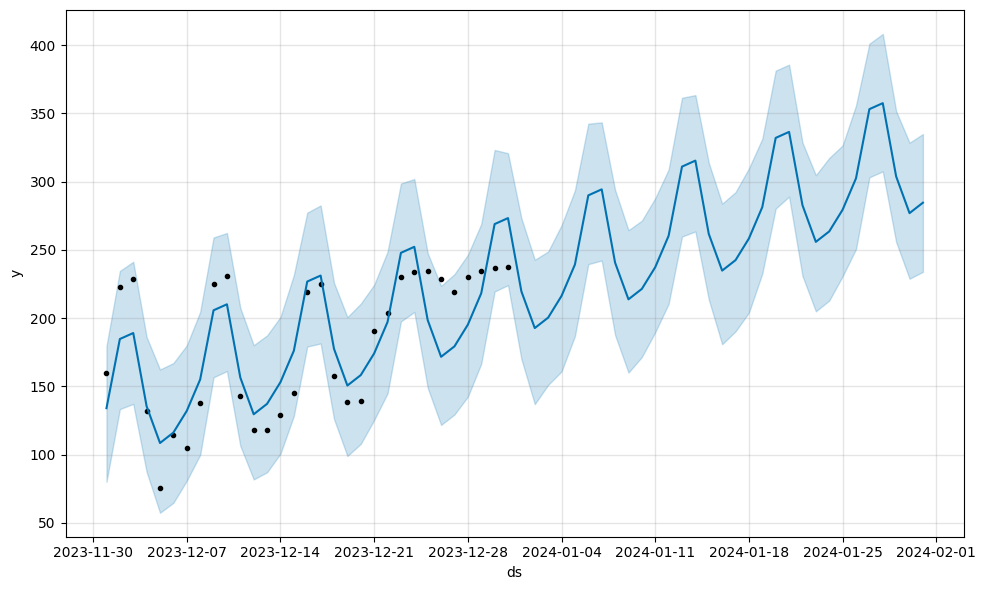

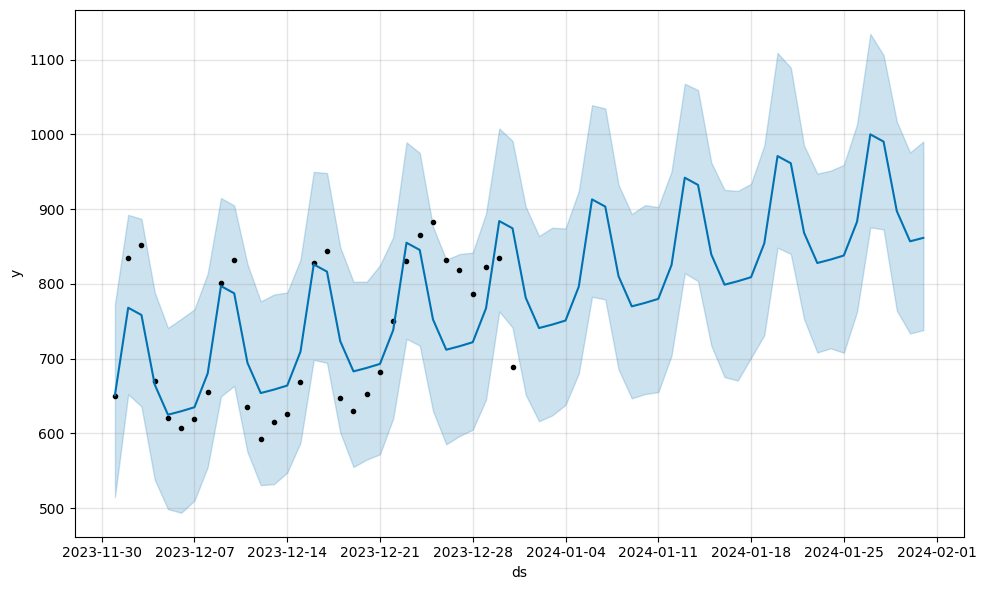

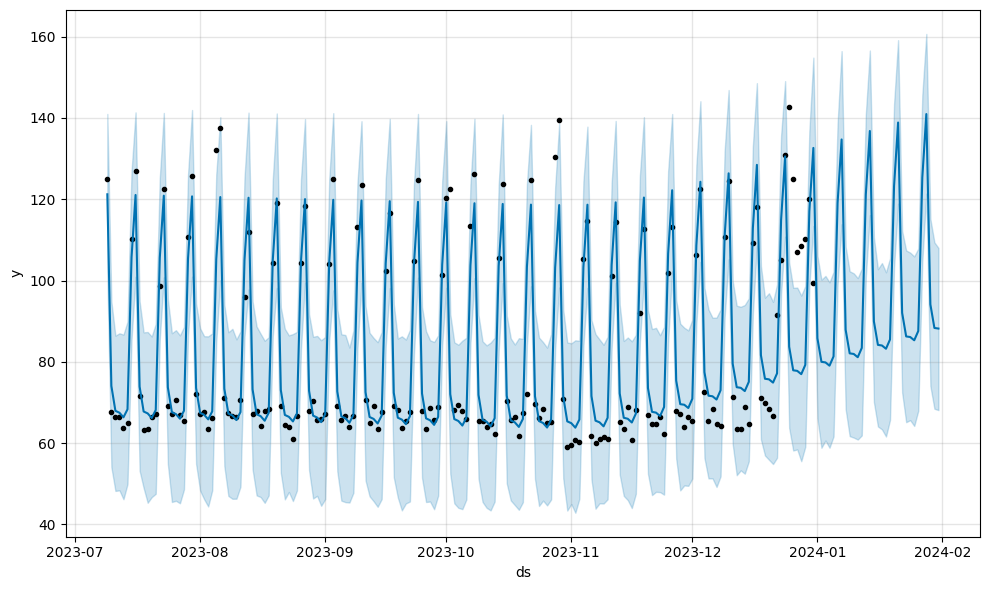

In [163]:
#creating an empty dataframe
target = pd.DataFrame()
# Looping over facilities to perform forecasting
for facility in facility_names.groups:
    group = facility_names.get_group(facility)
    model = prophet.Prophet(interval_width=0.95)
    
    # Fit the model to the data
    model.fit(group)
    
    # Create a future DataFrame
    future = model.make_future_dataframe(periods=31)
    
    # Generate forecasts
    forecast = model.predict(future)
    
    # Plot the forecast
    model.plot(forecast)
    
    # Rename columns in the forecast DataFrame
    forecast = forecast.rename(columns={"yhat": f"yhat_{facility}", "ds": "ds_forecast"})
    
    # Drop unnecessary columns before merging
    forecast = forecast[["ds_forecast", f"yhat_{facility}"]]
    
    # Merge with updated column names
    target = pd.merge(target, forecast.set_index("ds_forecast"), how="outer", left_index=True, right_index=True)

The blackpoints on the plots are the actual `parking_availability` and the blue points  are the predicted values. The light blue background  represents the confidence interval which in our case is set to 95%

In [164]:
target

,yhat_Bella Vista Car Park,yhat_Campbelltown Farrow Rd North Car Park,yhat_Campbelltown Hurley Street South Car Park,yhat_Cherrybrook Car Park,yhat_Dee Why Car Park,yhat_Edmondson Park South Car Park,yhat_Gordon Henry St North Car Park,yhat_Gosford Car Park,yhat_Hills Showground Car Park,yhat_Hornsby Jersey St Car Park,...,yhat_Revesby Car Park,yhat_Schofields Car Park,yhat_St Marys Car Park,yhat_Sutherland East Parade Car Park,yhat_Tallawong P1 Car Park,yhat_Tallawong P2 Car Park,yhat_Tallawong P3 Car Park,yhat_Warriewood Car Park,yhat_Warwick Farm Car Park,yhat_West Ryde Car Park
ds_forecast,,,,,,,,,,,,,,,,,,,,,
2023-07-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,121.211025
2023-07-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.065768
2023-07-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.948113
2023-07-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.478311
2023-07-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,66.354069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-27,850.280608,25.117970,115.017591,316.972048,148.180972,1718.104147,259.480880,862.056939,621.848349,182.299561,...,1129.064498,983.147223,808.113853,406.124197,33.233944,411.248272,573.794503,353.081523,1000.118881,125.336983
2024-01-28,901.856527,23.085449,121.126013,327.100760,148.499615,1739.050323,263.334312,816.683174,645.489261,187.552456,...,1144.751205,979.271140,819.198907,443.351361,41.717933,416.585208,576.059214,357.481969,990.469801,140.950021
2024-01-29,807.615586,23.361785,95.169455,266.141896,132.697331,1539.982404,199.741139,732.428990,500.141202,157.553414,...,1035.721816,824.527581,715.574747,367.545182,35.632049,314.364275,459.621799,303.797086,897.449311,94.126436


In [165]:
final_target = target[["yhat_"+facility for facility in facility_names.groups.keys()]]

In [166]:
final_target

,yhat_Bella Vista Car Park,yhat_Campbelltown Farrow Rd North Car Park,yhat_Campbelltown Hurley Street South Car Park,yhat_Cherrybrook Car Park,yhat_Dee Why Car Park,yhat_Edmondson Park South Car Park,yhat_Gordon Henry St North Car Park,yhat_Gosford Car Park,yhat_Hills Showground Car Park,yhat_Hornsby Jersey St Car Park,...,yhat_Revesby Car Park,yhat_Schofields Car Park,yhat_St Marys Car Park,yhat_Sutherland East Parade Car Park,yhat_Tallawong P1 Car Park,yhat_Tallawong P2 Car Park,yhat_Tallawong P3 Car Park,yhat_Warriewood Car Park,yhat_Warwick Farm Car Park,yhat_West Ryde Car Park
ds_forecast,,,,,,,,,,,,,,,,,,,,,
2023-07-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,121.211025
2023-07-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.065768
2023-07-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.948113
2023-07-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.478311
2023-07-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,66.354069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-27,850.280608,25.117970,115.017591,316.972048,148.180972,1718.104147,259.480880,862.056939,621.848349,182.299561,...,1129.064498,983.147223,808.113853,406.124197,33.233944,411.248272,573.794503,353.081523,1000.118881,125.336983
2024-01-28,901.856527,23.085449,121.126013,327.100760,148.499615,1739.050323,263.334312,816.683174,645.489261,187.552456,...,1144.751205,979.271140,819.198907,443.351361,41.717933,416.585208,576.059214,357.481969,990.469801,140.950021
2024-01-29,807.615586,23.361785,95.169455,266.141896,132.697331,1539.982404,199.741139,732.428990,500.141202,157.553414,...,1035.721816,824.527581,715.574747,367.545182,35.632049,314.364275,459.621799,303.797086,897.449311,94.126436


The dataframe above contains the forecast of the next 1 month based on the previous data the model has learned. We will plot the actual values versus the predicted values to see how  well our model is performing.

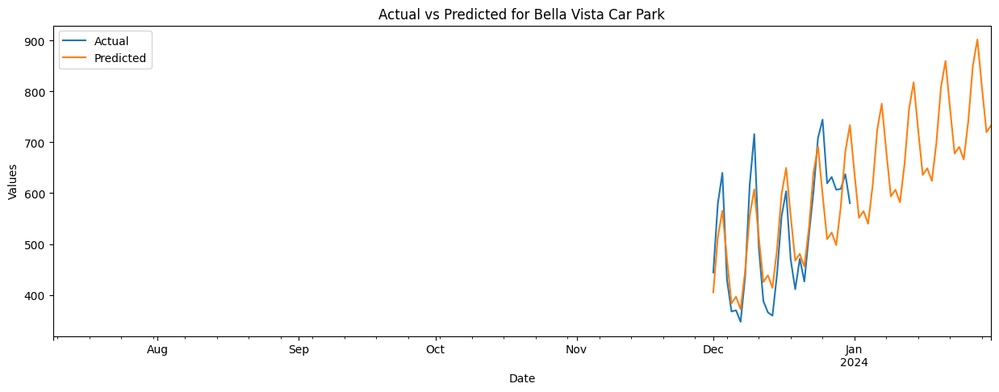

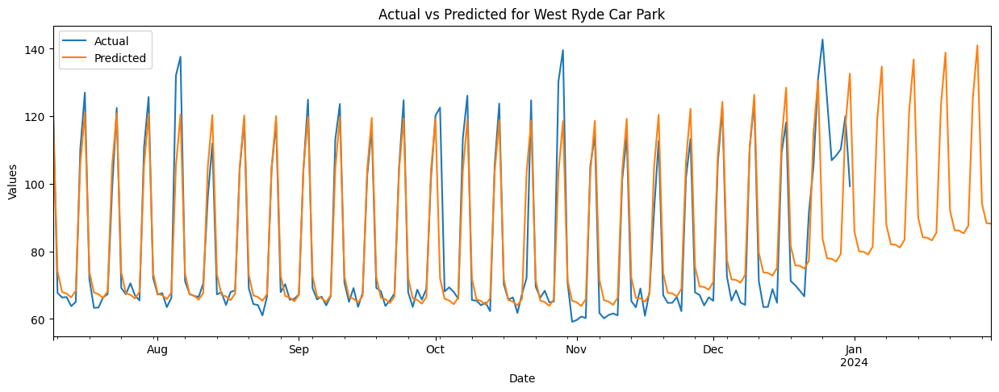

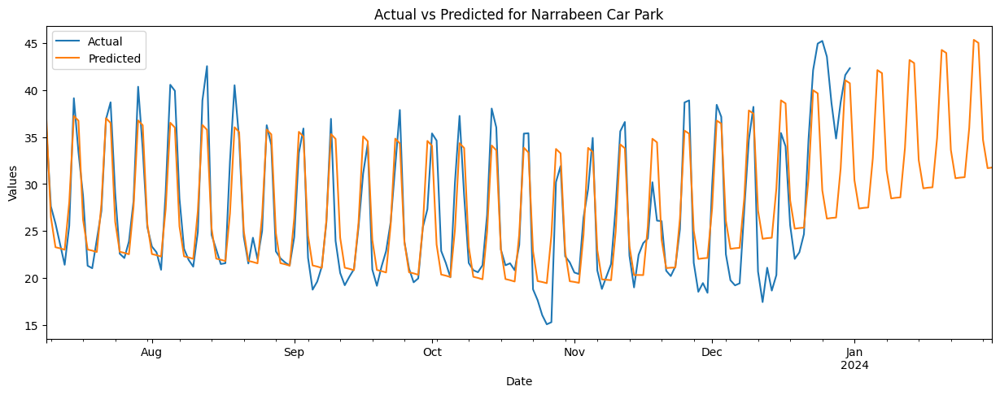

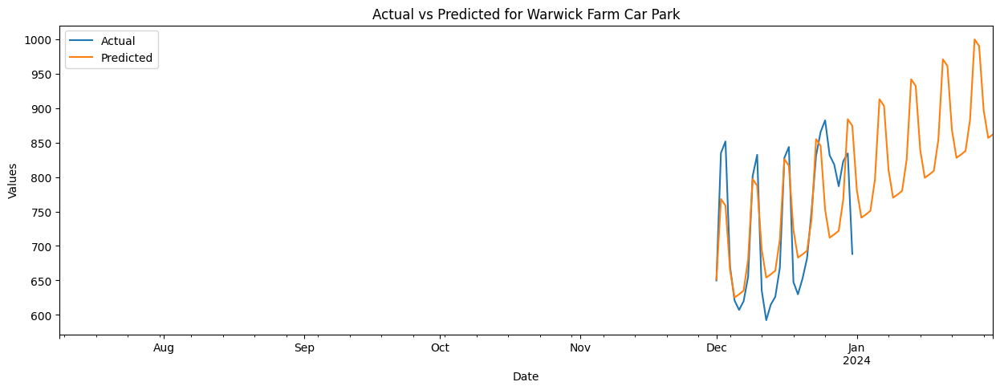

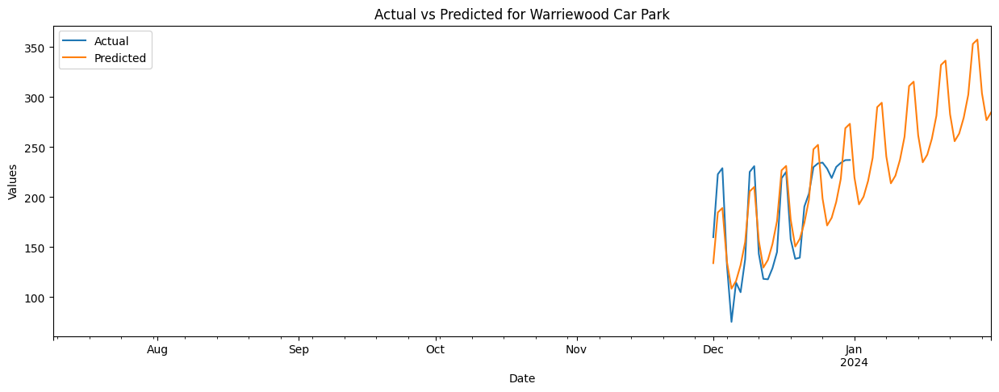

...

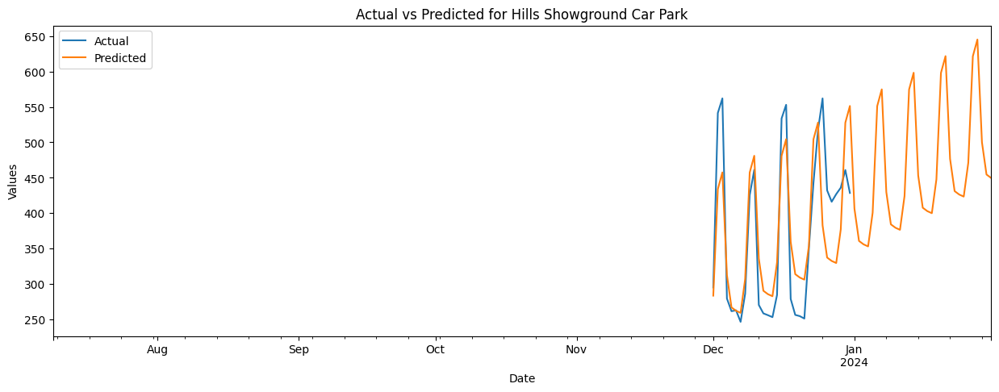

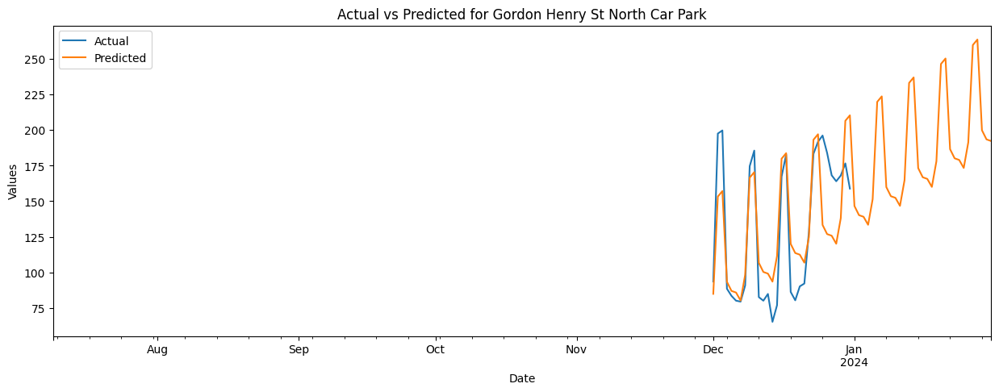

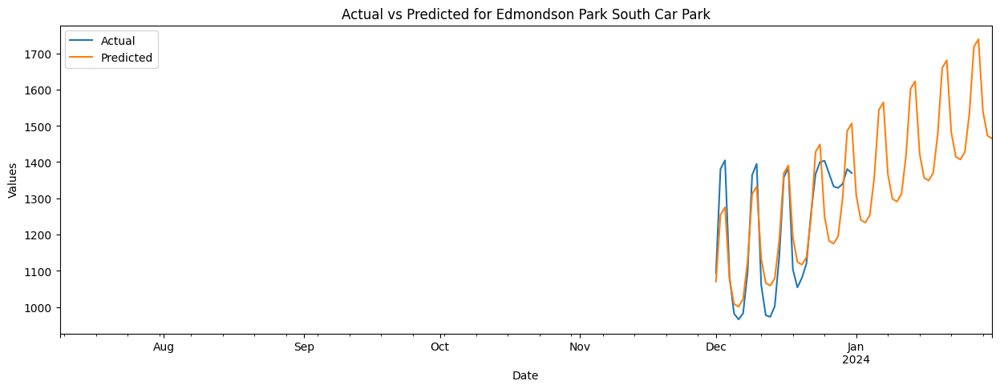

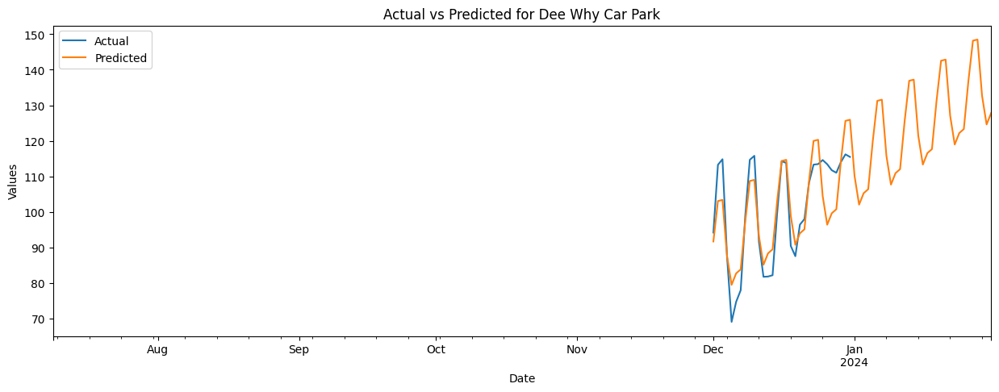

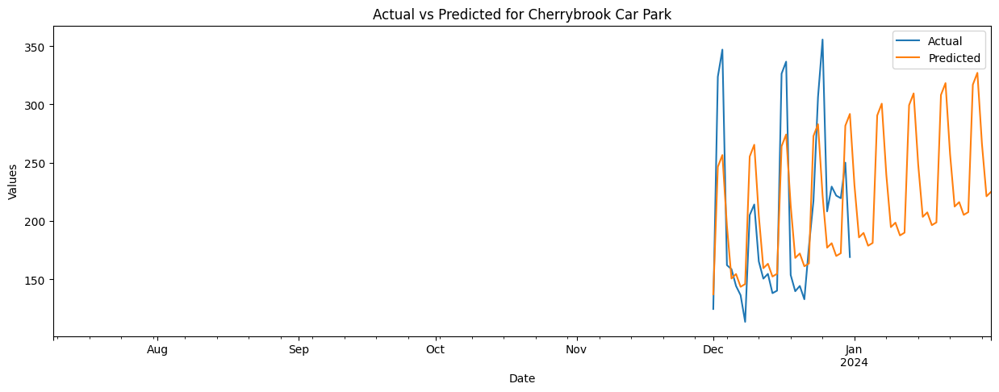

In [167]:
#facilities names
facility_names = ["Bella Vista Car Park", "West Ryde Car Park", "Narrabeen Car Park",
                    "Warwick Farm Car Park", "Warriewood Car Park","Tallawong P2 Car Park",
                    "Tallawong P1 Car Park", "Sutherland East Parade Car Park", "St Marys Car Park", "Revesby Car Park",
                    "Penrith Combewood Multi-Level Car Park", "Penrith Combewood At-Grade Car Park", "Leppington Car Park",
                    "Kellyville South Car Park", "Kellyville North Car Park", "Hornsby Jersey St Car Park", "Hills Showground Car Park",
                    "Gordon Henry St North Car Park", "Edmondson Park South Car Park", "Dee Why Car Park", "Cherrybrook Car Park"]

# Loop through facility names
for facility in facility_names:
    # Get actual data for the facility from the original dataset
    actual_data = final_prophet_data.set_index("ds").query(f"facility_name == '{facility}'")["y"]

    # Get predicted data for the facility from the target DataFrame
    predicted_data = target[f"yhat_{facility}"]

    # Concatenate actual and predicted data
    combined_data = pd.concat([actual_data, predicted_data], axis=1)

    # Plot the actual vs predicted data 
    fig, ax = plt.subplots(figsize=(15, 5))
    combined_data.plot(ax=ax, title=f"Actual vs Predicted for {facility}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Values")
    ax.legend(["Actual", "Predicted"])


From the plots we can see our model recognizes the seasonality of our data although it doesn't recognize the peaks and this can suggest doing a multivariate analysis to incorporate other exogenous(external)  variables such as holidays and weather to see if our model will recognize the peaks
#### Evaluating the model
The metrics used to evaluate timeseries  forecasting models are: MAE (Mean Absolute Error), RMSE (Root Mean Squared Error) and MAPE (Mean Absolute Percentage Error). We will use these metrics to evaluate our model

#### Multivariate Prophet modelling
As we saw in our initial model that the peaks couldn't be recognized when making predictions, we will go ahead and build another model that incorporates other external variables to see if the model will improve on realising the points it didn't recognize earlier 

In [188]:
#our original dataframe
pprophet_data

,date_time,facility_name,ParkID,zone_id,total_parking_spots,occupancy_total,day_of_week,parking_availability,time_category,z_score
0,2023-12-01 00:09:20,Edmondson Park South Car Park,1,1,1429,28,Friday,1401,Night,2.535373
1,2023-12-01 00:12:57,Edmondson Park South Car Park,1,1,1429,27,Friday,1402,Night,2.537913
2,2023-12-01 00:13:45,Edmondson Park South Car Park,1,1,1429,26,Friday,1403,Night,2.540453
3,2023-12-01 00:17:43,Edmondson Park South Car Park,1,1,1429,25,Friday,1404,Night,2.542992
4,2023-12-01 00:27:43,Edmondson Park South Car Park,1,1,1429,25,Friday,1404,Night,2.542992
...,...,...,...,...,...,...,...,...,...,...
599280,2023-12-31 23:21:38,Campbelltown Hurley Street South Car Park,1,1,118,62,Sunday,56,Night,-0.880331
599281,2023-12-31 23:31:38,Campbelltown Hurley Street South Car Park,1,1,118,62,Sunday,56,Night,-0.880331
599282,2023-12-31 23:39:15,Campbelltown Hurley Street South Car Park,1,1,118,61,Sunday,57,Night,-0.877792
599283,2023-12-31 23:49:15,Campbelltown Hurley Street South Car Park,1,1,118,61,Sunday,57,Night,-0.877792


In [189]:
#setting datetime as index
second_prophet_data = pprophet_data.drop(["ParkID", "zone_id", "z_score", "time_category"], axis= 1)
#getting dummies
dummies_df = pd.get_dummies(second_prophet_data[['day_of_week']],
                            columns=["day_of_week"], prefix= ["day"])
#converting dummies to numerical
dummies_df = dummies_df.astype(int)
#joining the dummies and original df
final_df = pd.concat( [second_prophet_data, dummies_df] ,axis=1)
#dropping cat columns
final_df.drop( columns = "day_of_week", axis= 1, inplace = True)

In [190]:

#inspecting our final df
final_df.head()


,date_time,facility_name,total_parking_spots,occupancy_total,parking_availability,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
0,2023-12-01 00:09:20,Edmondson Park South Car Park,1429,28,1401,1,0,0,0,0,0,0
1,2023-12-01 00:12:57,Edmondson Park South Car Park,1429,27,1402,1,0,0,0,0,0,0
2,2023-12-01 00:13:45,Edmondson Park South Car Park,1429,26,1403,1,0,0,0,0,0,0
3,2023-12-01 00:17:43,Edmondson Park South Car Park,1429,25,1404,1,0,0,0,0,0,0
4,2023-12-01 00:27:43,Edmondson Park South Car Park,1429,25,1404,1,0,0,0,0,0,0


Now we have all columns in a format we can work with in machine learning. 

Lets resample the data into daily observations for easy handling

In [191]:
#setting date to datetime
final_df['date_time'] = pd.to_datetime(final_df['date_time'])

# Set the datetime as index
final_df.set_index('date_time', inplace=True)
#resampling our data
final_data = final_df.groupby("facility_name").resample("D").mean()
#reset index
final_data = final_data.reset_index()

Renaming our columns in order to fit the prophet model

In [192]:
#renaming columns
col_mapper  = {"date_time": "ds", "parking_availability": "y"}
#rename
final_data.rename(columns=col_mapper, inplace=True)
#inspecting
final_data.head()

,facility_name,ds,total_parking_spots,occupancy_total,y,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
0,Bella Vista Car Park,2023-12-01,777.0,332.854559,444.145441,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Bella Vista Car Park,2023-12-02,777.0,197.873521,579.126479,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,Bella Vista Car Park,2023-12-03,777.0,137.133550,639.866450,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,Bella Vista Car Park,2023-12-04,777.0,346.532401,430.467599,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,Bella Vista Car Park,2023-12-05,777.0,409.501304,367.498696,0.0,0.0,0.0,0.0,0.0,1.0,0.0


Splitting our data into train and test

In [173]:
# train= final_data[(final_data['ds'] >= '2023-06-01') & (final_data['ds'] <= '2023-09-31')] 
# test= final_data[(final_data['ds'] > '2023-09-31')]

Instantiating prophet model so we can start modelling 

In [193]:

#grouping by facility in order to get predictions for each
parking_lots = final_data.groupby("facility_name")


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1


INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yea

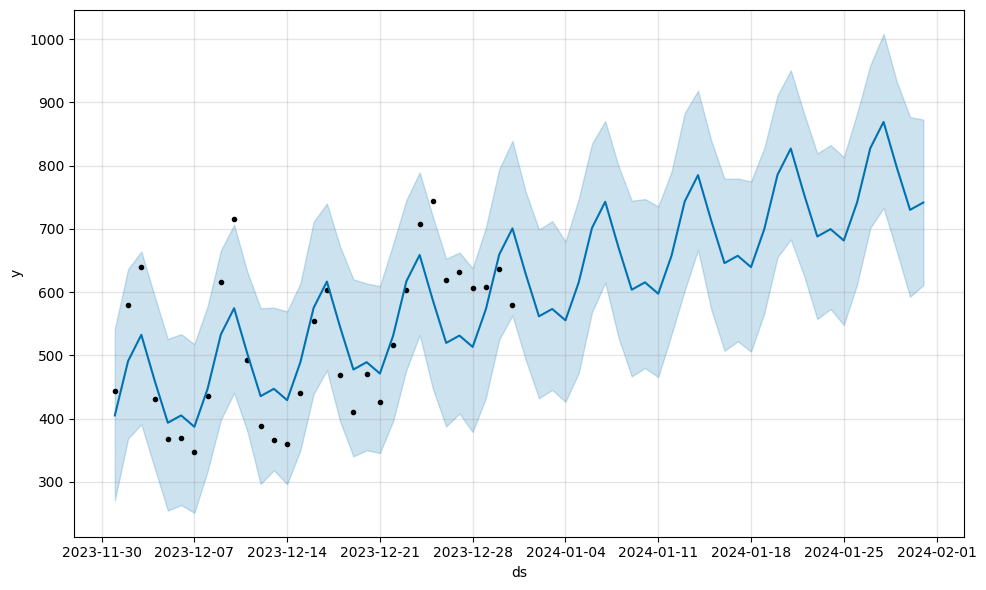

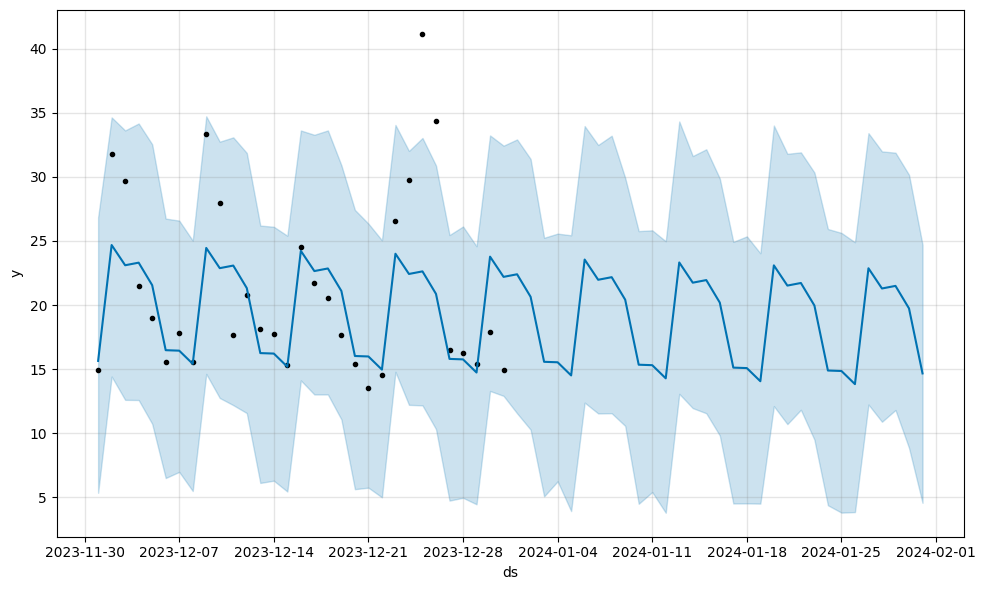

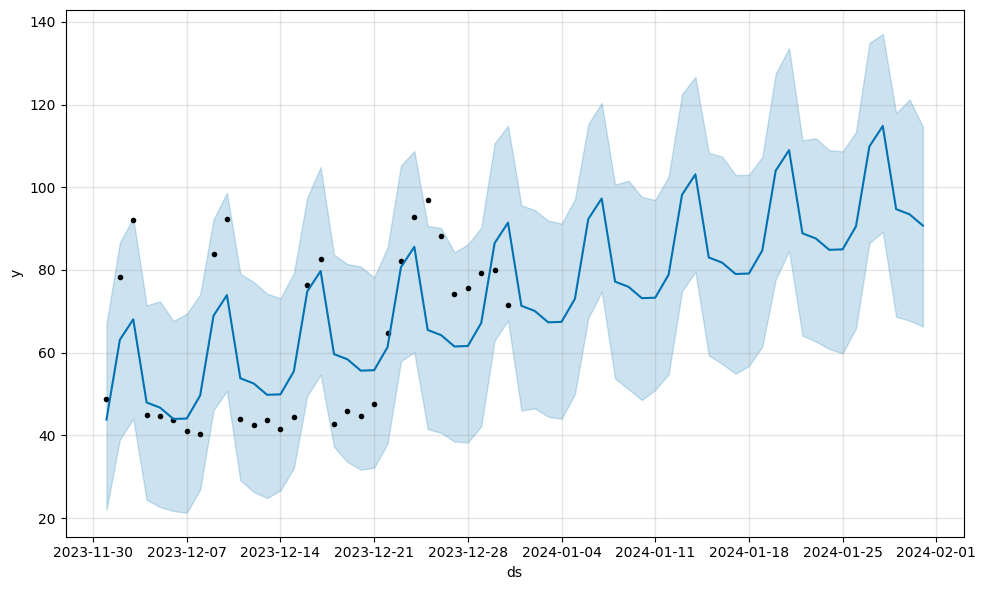

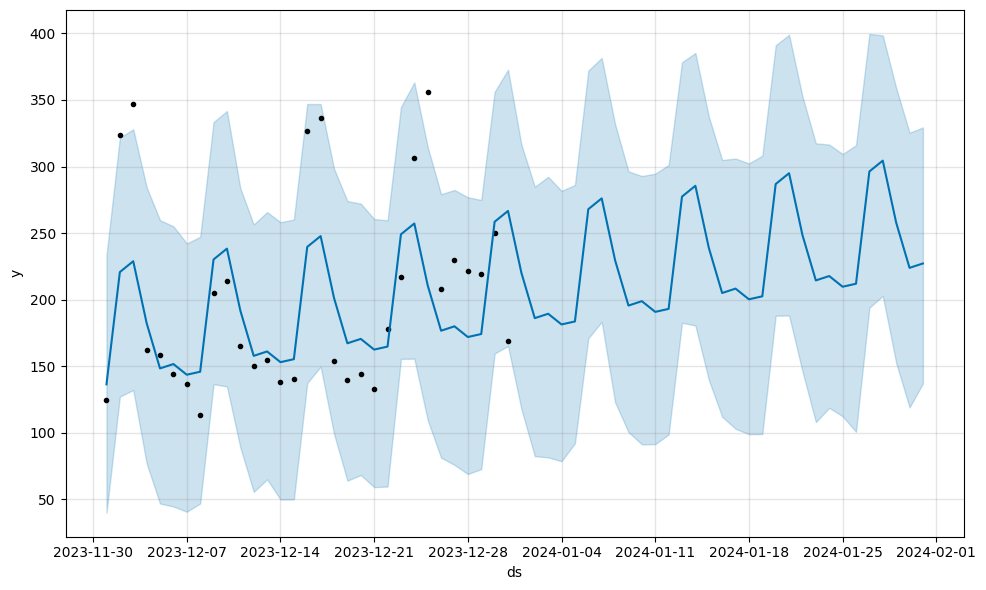

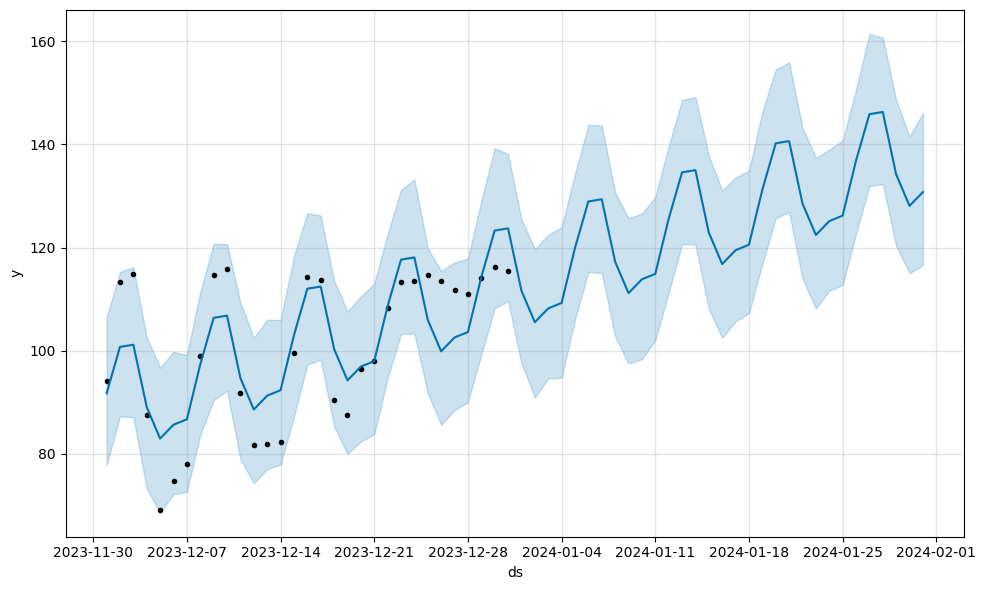

...

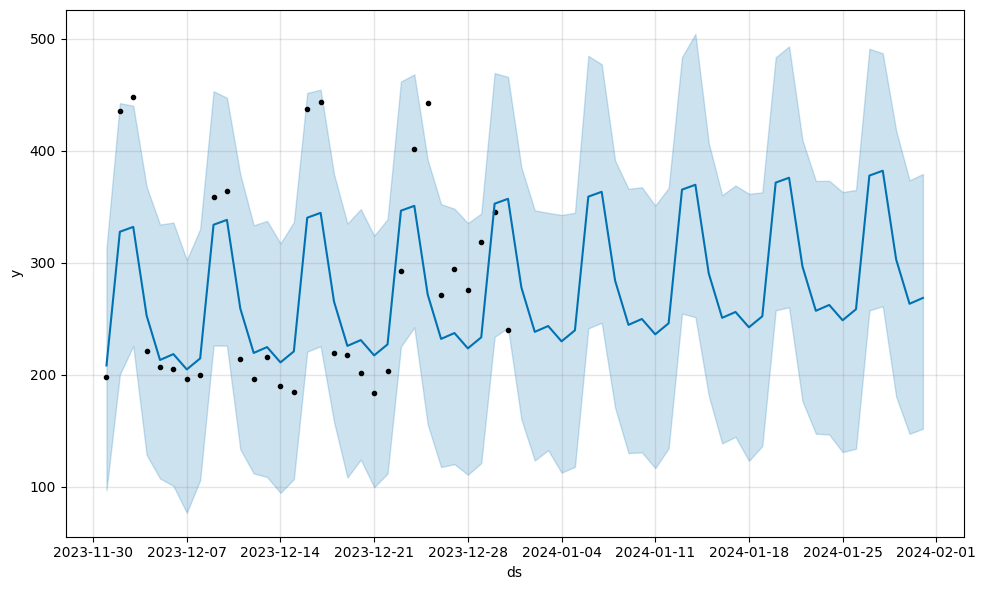

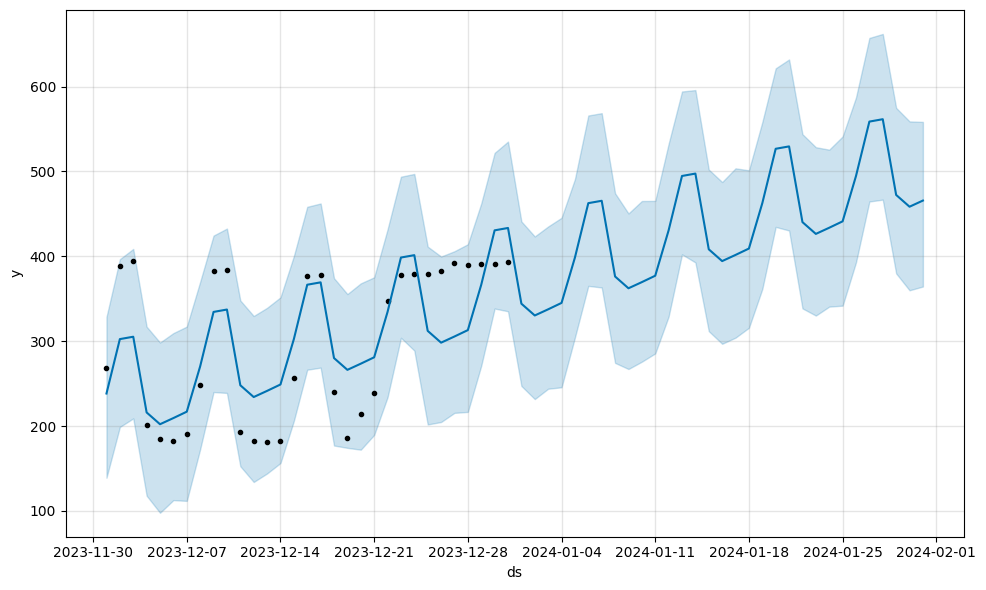

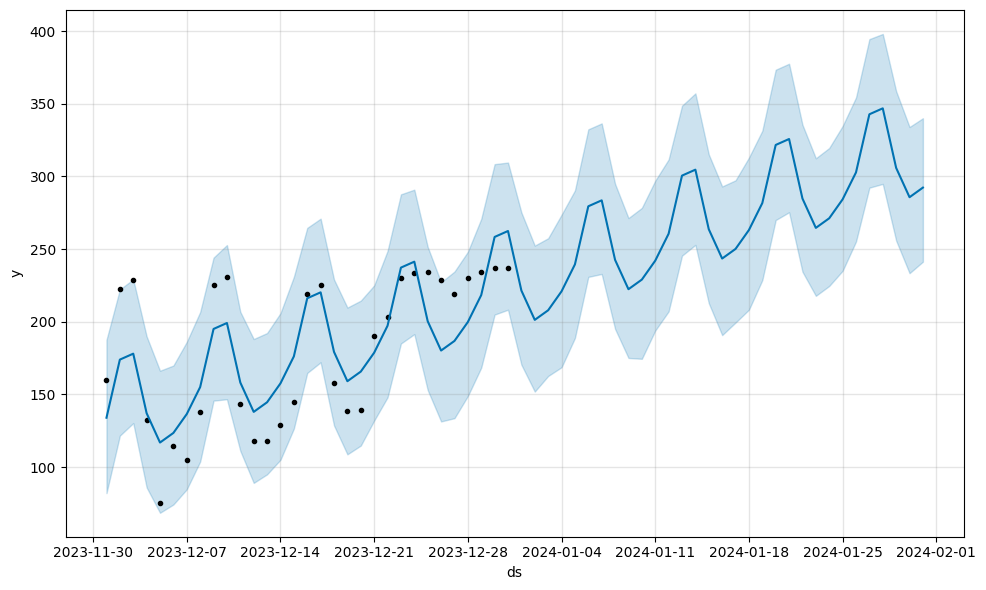

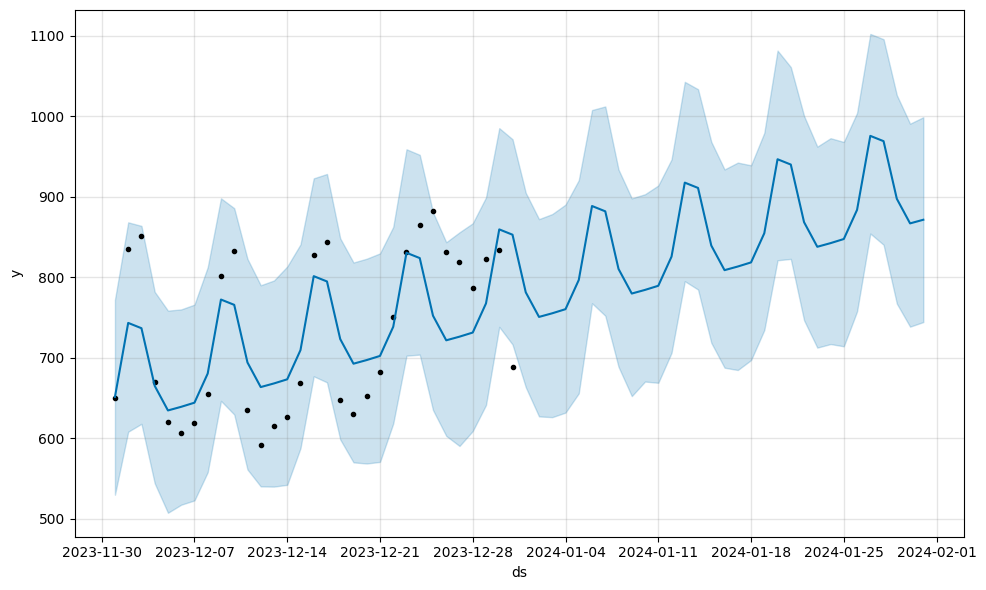

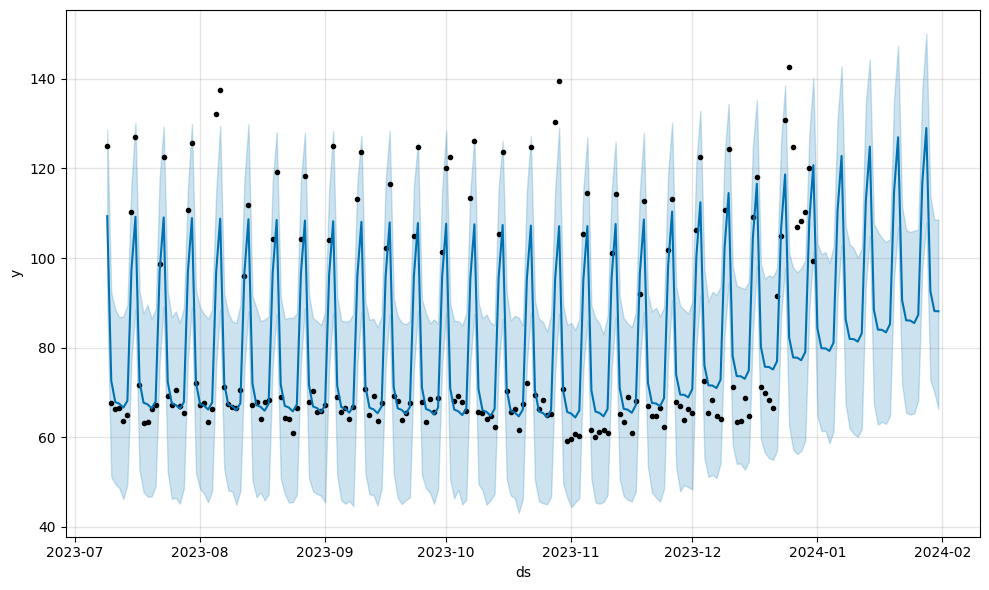

In [194]:
# Creating an empty dataframe
second_target = pd.DataFrame()

# Looping over facilities to perform forecasting
for facility in parking_lots.groups:
    group = parking_lots.get_group(facility)
    
    # Instantiate the model
    prophet_model = prophet.Prophet(interval_width=0.95, daily_seasonality= False)
    
    #Adding regressors to the model
    for col in dummies_df.columns:
        prophet_model.add_regressor(col)
    
    # Fit the model to the data
    prophet_model.fit(group)
    
    # Create a future DataFrame with regressors
    future = prophet_model.make_future_dataframe(periods=31)
    
    for col in dummies_df.columns:
        future[col] = dummies_df[col]
    
    # Generate forecasts
    forecast = prophet_model.predict(future)
    
    # Plot the forecast
    prophet_model.plot(forecast)
    
    # Rename columns in the forecast DataFrame
    forecast = forecast.rename(columns={"yhat": f"yhat_{facility}", "ds": "ds_forecast"})
    
    # Drop unnecessary columns before merging
    forecast = forecast[["ds_forecast", f"yhat_{facility}"]]
    
    # Merge with updated column names
    second_target = pd.merge(second_target, forecast.set_index("ds_forecast"), how="outer", left_index=True, right_index=True)


Plotting actual versus predicted

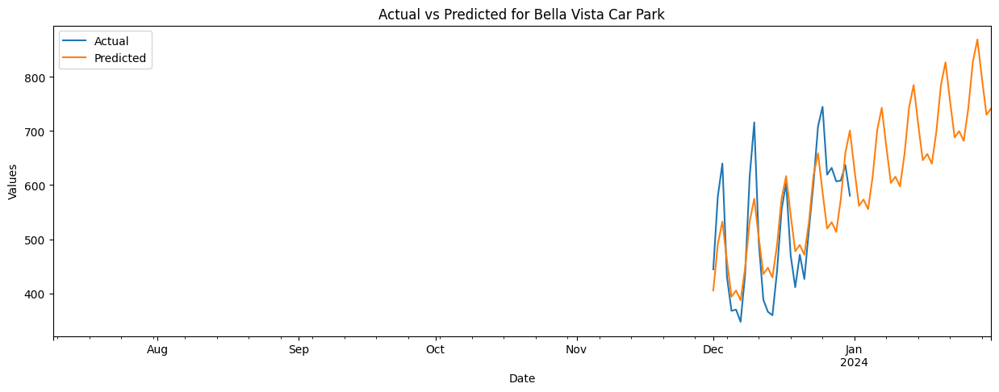

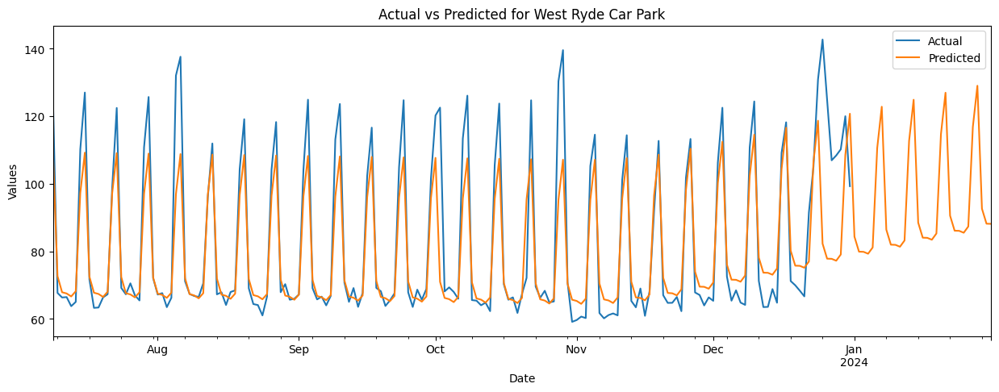

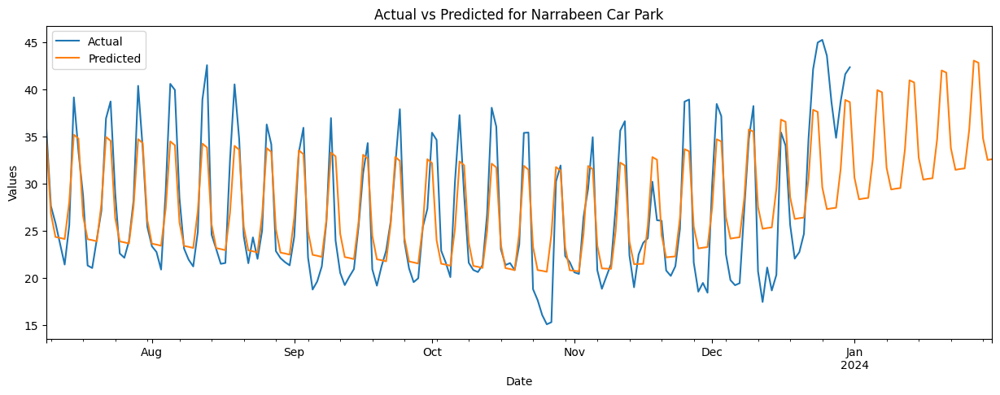

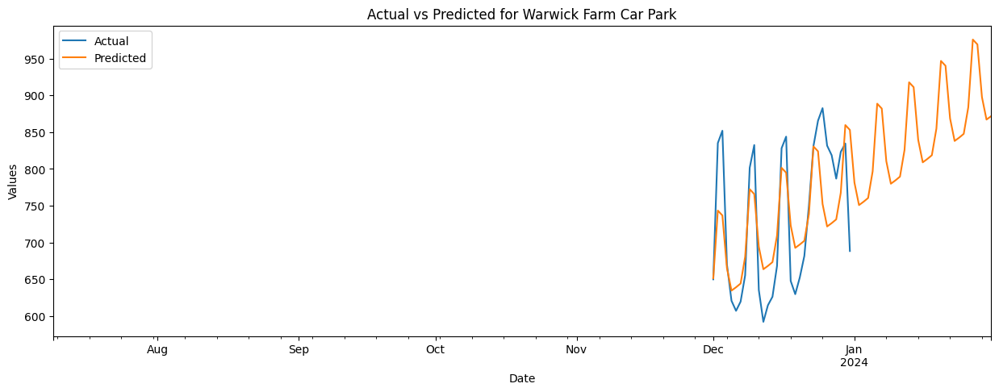

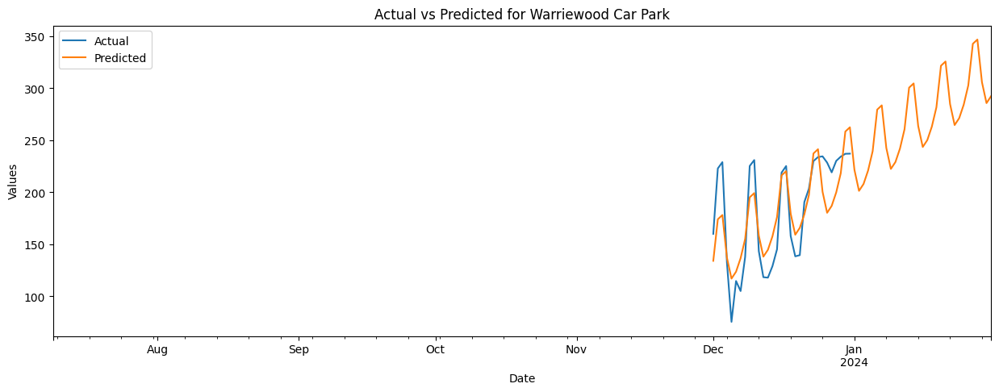

...

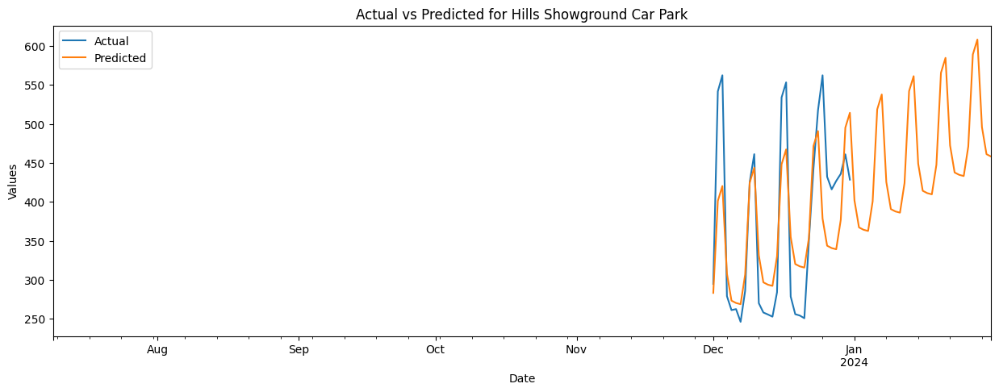

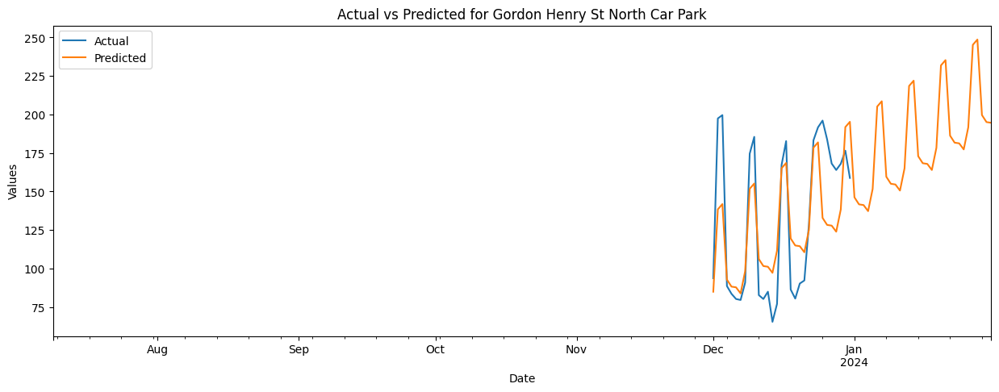

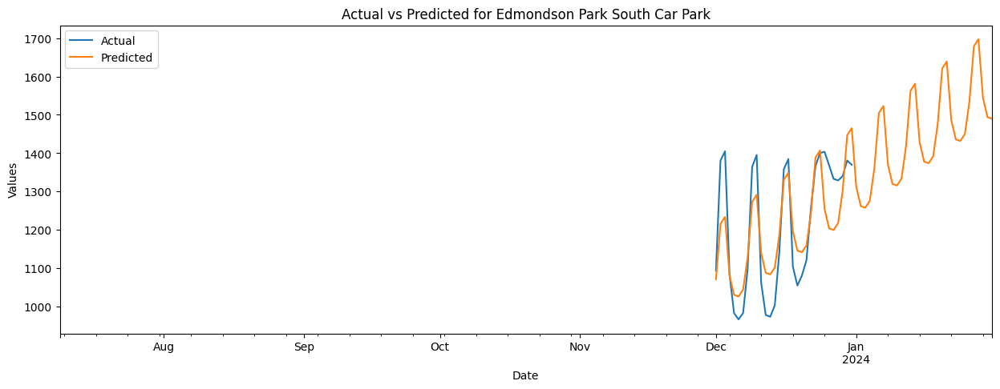

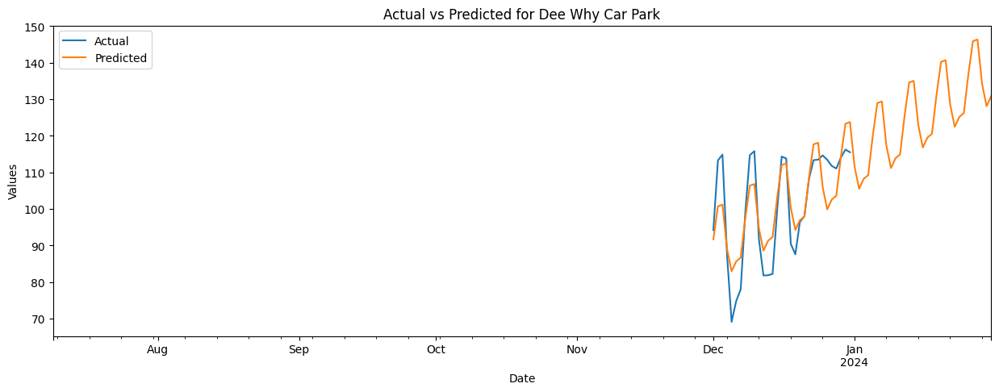

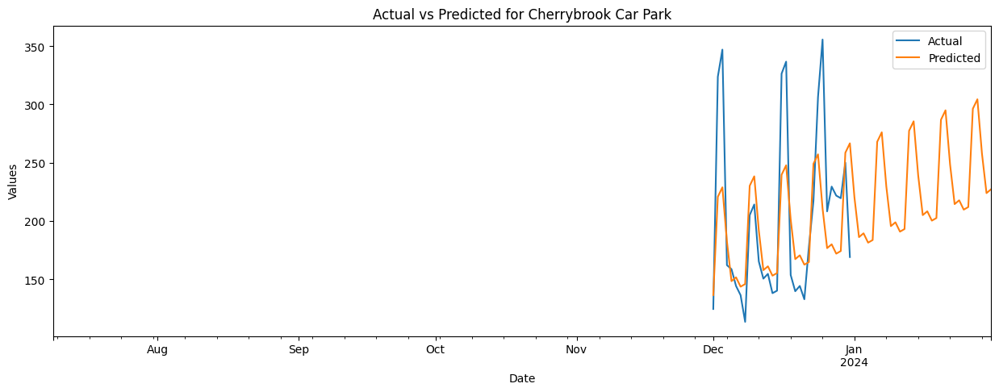

In [195]:
#facilities names
facility_names = ["Bella Vista Car Park", "West Ryde Car Park", "Narrabeen Car Park",
                    "Warwick Farm Car Park", "Warriewood Car Park","Tallawong P2 Car Park",
                    "Tallawong P1 Car Park", "Sutherland East Parade Car Park", "St Marys Car Park", "Revesby Car Park",
                    "Penrith Combewood Multi-Level Car Park", "Penrith Combewood At-Grade Car Park", "Leppington Car Park",
                    "Kellyville South Car Park", "Kellyville North Car Park", "Hornsby Jersey St Car Park", "Hills Showground Car Park",
                    "Gordon Henry St North Car Park", "Edmondson Park South Car Park", "Dee Why Car Park", "Cherrybrook Car Park"]

# Loop through facility names
for facility in facility_names:
    # Get actual data for the facility from the original dataset
    actual_data = final_data.set_index("ds").query(f"facility_name == '{facility}'")["y"]

    # Get predicted data for the facility from the target DataFrame
    predicted_data = second_target[f"yhat_{facility}"]

    # Concatenate actual and predicted data
    combined_data = pd.concat([actual_data, predicted_data], axis=1)

    # Plot the actual vs predicted data 
    fig, ax = plt.subplots(figsize=(15, 5))
    combined_data.plot(ax=ax, title=f"Actual vs Predicted for {facility}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Values")
    ax.legend(["Actual", "Predicted"])

Evaluating the model using metrics

In [205]:
# mse = mean_squared_error(final_data['y'], forecast["yhat"][-len(actual_data):])
# rmse = np.sqrt(mse)
# mae = mean_absolute_error()